# This script represents visualization of PCA and UMAP after feature selection 

## Data Load

First import the data and check whether there are some missing values:

In [143]:
import pandas as pd
data = pd.read_csv("./gdc_data/last_file.csv", delimiter="\t", index_col=0, low_memory=False)

# data = data.T


In [22]:
import sklearn

In [ ]:
data

In [150]:
data.tumor_stage.value_counts()

stage_2    694
stage_3    283
stage_1    188
stage_4     20
Name: tumor_stage, dtype: int64

Deleting stage 4, because, there is very small amount of objects

In [24]:
data1 = data[data.tumor_stage != "stage_4"]

Changing string classification to int variable

In [148]:
y = data1.tumor_stage
X = data1.drop(['tumor_stage'], axis=1)

# y.replace({"stage_1": 0}, inplace=True)
# y.replace({"stage_2": 1}, inplace=True)
# y.replace({"stage_3": 2}, inplace=True)


In [27]:
X.isnull().sum().sum()

0

In [29]:
y_initial = y
y

9c2ffccc-c4c8-4f87-bcd8-8ce099e31b1b.tsv    stage_1
98bb8ea9-025e-40cd-a21e-3a9dd478ef23.tsv    stage_1
80072d64-b734-46ef-b4bf-a9e5cd0d5d06.tsv    stage_1
d14add36-6662-47ce-9a26-3374bf1e8807.tsv    stage_1
728be0eb-7a5b-42cd-84d9-6a86cec842d5.tsv    stage_1
                                             ...   
e3cacc94-c92a-42b1-9fad-9db163983729.tsv    stage_3
c7843936-3b14-48b4-8642-8554341d3f21.tsv    stage_3
f6d3d770-157b-479b-a5cc-56e174dda026.tsv    stage_3
837edc9c-0d20-4889-a9cd-a54ed6b68d13.tsv    stage_3
3bdf6376-9aa9-44cc-a1f1-5a6387edce23.tsv    stage_3
Name: tumor_stage, Length: 1165, dtype: object

In [30]:
# let's delete all columns with empty or mostly empty vales:
X_initial = X[X.columns[X.sum()>0.01]]

col_name = X.columns
sum_arr = []

for col in col_name:
    sum_arr.append(sum(X[col]))

## Functions for visualization

In [57]:
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import umap.umap_ as umap

def pca_create_visualize(df):
    """
    PCA creator and visualizer
    """
    data_numeric = pd.DataFrame(df)


    pca = PCA(0.90) # 90% of confidency chosen
    data_numeric_pca = pca.fit_transform(df)


    X_pca = pd.DataFrame(data_numeric_pca)
    print("After feature selection with PCA, from 60483 features we left %i features"%(X_pca.shape[1]))
    
    
    #
    # Determine explained variance using explained_variance_ration_ attribute
    #
    exp_var_pca = pca.explained_variance_ratio_
    #
    # Cumulative sum of eigenvalues; This will be used to create step plot
    # for visualizing the variance explained by each principal component.
    #
    cum_sum_eigenvalues = np.cumsum(exp_var_pca)
    #
    # Create the visualization plot
    cum_sum_eigenvalues

    fig = plt.figure(figsize =(15 , 10.))
    plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
    plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal component index')
    plt.legend(loc='best')
    plt.tight_layout()
    plt.savefig("pca_explained.svg")
    plt.show()
    
    fig = plt.figure(figsize =(15 , 10.))
    plot = plt.scatter(list(X_pca[0]), list(X_pca[1]), c=list(y))
    plt.legend(handles=plot.legend_elements()[0], labels=list(set(y)))
    plt.ylabel('PC1')
    plt.xlabel('PC2')
    plt.savefig("pca.svg")
    
    plt.show()
    
    return X_pca


def umap_create_visualize(df, n_neighbors=10, metric='euclidean'):
    
    reducer = umap.UMAP(n_neighbors=n_neighbors, metric = metric)

    embedding = reducer.fit_transform(df)
    
    print(embedding.shape)

    fig = plt.figure(figsize =(15 , 10.))
    plot = plt.scatter(list(embedding[:,0]), list(embedding[:,1]), c=list(y))
    plt.legend(handles=plot.legend_elements()[0], labels=list(set(y)))
    plt.ylabel('UMAP1')
    plt.xlabel('UMAP2')
    plt.savefig("umap.svg")
    plt.show()
    return embedding

## 1 Feature selection - None

In [42]:
X = X_initial

## 1.0 - No normalization

In [33]:
%%time

X1_norm0 = X


CPU times: user 2.03 ms, sys: 3 µs, total: 2.04 ms
Wall time: 2.06 ms


## 1.1 Normalization1  - min max normalization

In [71]:
%%time

X1_norm1 = (X - X.min()) /(X.max() - X.min())


CPU times: user 32.2 ms, sys: 32.1 ms, total: 64.4 ms
Wall time: 62.7 ms


## 1.2 Normalization2 - Z-score transformation

In [72]:
X1_norm2 = X.apply(lambda iterator: ((iterator - iterator.mean())/iterator.std()).round(2))

## 1.3 Normalization3 - RobustScaler

In [73]:
from sklearn.preprocessing import RobustScaler

X1_norm3 = RobustScaler().fit_transform(X)

## 1.4 Normalization4 - StandardScaler

In [74]:
from sklearn.preprocessing import StandardScaler


X1_norm4 = StandardScaler().fit_transform(X)

## 1.5 Normalization5 - log2Transform

In [75]:
import numpy as np


X1_norm5 = X.transform(lambda x: np.log2(x + 1))

### Now let's visualize normalization

In [39]:
X1_norm1

,ENSG00000000003.13,ENSG00000000005.5,ENSG00000000419.11,ENSG00000000457.12,ENSG00000000460.15,ENSG00000000938.11,ENSG00000000971.14,ENSG00000001036.12,ENSG00000001084.9,ENSG00000001167.13,...,ENSG00000281903.1,ENSG00000281904.1,ENSG00000281905.1,ENSG00000281906.1,ENSG00000281909.1,ENSG00000281910.1,ENSG00000281912.1,ENSG00000281918.1,ENSG00000281920.1,ENSG00000281921.1
9c2ffccc-c4c8-4f87-bcd8-8ce099e31b1b.tsv,0.095820,0.042091,0.045341,0.185356,0.040327,0.013855,0.273566,0.034441,0.095417,0.037929,...,0.019611,0.000000,0.0,0.0,0.053742,0.0,0.091552,0.033615,0.091672,0.0
98bb8ea9-025e-40cd-a21e-3a9dd478ef23.tsv,0.060857,0.000087,0.027923,0.225883,0.056409,0.028797,0.049721,0.111418,0.063764,0.032243,...,0.045911,0.000000,0.0,0.0,0.000000,0.0,0.090224,0.042374,0.057779,0.0
80072d64-b734-46ef-b4bf-a9e5cd0d5d06.tsv,0.159727,0.000474,0.032379,0.330577,0.048448,0.023208,0.057924,0.080016,0.210489,0.033300,...,0.206365,0.000000,0.0,0.0,0.052782,0.0,0.083974,0.000000,0.000000,0.0
d14add36-6662-47ce-9a26-3374bf1e8807.tsv,0.066764,0.002656,0.066606,0.336004,0.084078,0.077056,0.049497,0.140191,0.142006,0.032719,...,0.009803,0.000000,0.0,0.0,0.000000,0.0,0.129024,0.000000,0.024058,0.0
728be0eb-7a5b-42cd-84d9-6a86cec842d5.tsv,0.127321,0.004733,0.107178,0.188802,0.019220,0.061087,0.094070,0.185335,0.190800,0.026120,...,0.021154,0.000000,0.0,0.0,0.000000,0.0,0.065866,0.000000,0.057682,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
e3cacc94-c92a-42b1-9fad-9db163983729.tsv,0.072109,0.000000,0.126848,0.165800,0.074664,0.068603,0.006996,0.118449,0.080483,0.030016,...,0.011414,0.000000,0.0,0.0,0.072986,0.0,0.595249,0.022826,0.000000,0.0
c7843936-3b14-48b4-8642-8554341d3f21.tsv,0.127002,0.000200,0.109351,0.271715,0.057471,0.025428,0.026332,0.189302,0.072593,0.052291,...,0.042638,0.000000,0.0,0.0,0.000000,0.0,0.027415,0.024361,0.016609,0.0
f6d3d770-157b-479b-a5cc-56e174dda026.tsv,0.015429,0.000483,0.161989,0.364269,0.151829,0.103036,0.121711,0.051667,0.109636,0.066824,...,0.124298,0.037569,0.0,0.0,0.000000,0.0,0.053933,0.000000,0.026758,0.0
837edc9c-0d20-4889-a9cd-a54ed6b68d13.tsv,0.023831,0.001477,0.017152,0.000000,0.006143,0.037039,0.206949,0.087069,0.005671,0.001036,...,0.009997,0.000000,0.0,0.0,0.000000,0.0,0.078219,0.014994,0.582688,0.0


In [34]:
X1_norm2

,ENSG00000000003.13,ENSG00000000005.5,ENSG00000000419.11,ENSG00000000457.12,ENSG00000000460.15,ENSG00000000938.11,ENSG00000000971.14,ENSG00000001036.12,ENSG00000001084.9,ENSG00000001167.13,...,ENSG00000281903.1,ENSG00000281904.1,ENSG00000281905.1,ENSG00000281906.1,ENSG00000281909.1,ENSG00000281910.1,ENSG00000281912.1,ENSG00000281918.1,ENSG00000281920.1,ENSG00000281921.1
9c2ffccc-c4c8-4f87-bcd8-8ce099e31b1b.tsv,0.75,0.95,-0.86,-0.68,-0.73,-0.85,2.49,-1.13,-0.48,-0.19,...,-0.57,-0.42,-0.09,-0.14,0.12,-0.16,-0.13,0.08,0.48,-0.08
98bb8ea9-025e-40cd-a21e-3a9dd478ef23.tsv,0.03,-0.15,-1.10,-0.38,-0.50,-0.68,-0.50,0.19,-0.84,-0.31,...,-0.21,-0.42,-0.09,-0.14,-0.54,-0.16,-0.15,0.21,0.04,-0.08
80072d64-b734-46ef-b4bf-a9e5cd0d5d06.tsv,2.07,-0.14,-1.04,0.42,-0.61,-0.75,-0.39,-0.35,0.84,-0.29,...,1.98,-0.42,-0.09,-0.14,0.11,-0.16,-0.23,-0.40,-0.73,-0.08
d14add36-6662-47ce-9a26-3374bf1e8807.tsv,0.15,-0.08,-0.56,0.46,-0.11,-0.13,-0.50,0.68,0.06,-0.30,...,-0.70,-0.42,-0.09,-0.14,-0.54,-0.16,0.34,-0.40,-0.41,-0.08
728be0eb-7a5b-42cd-84d9-6a86cec842d5.tsv,1.40,-0.03,0.02,-0.66,-1.02,-0.31,0.09,1.45,0.62,-0.44,...,-0.55,-0.42,-0.09,-0.14,-0.54,-0.16,-0.46,-0.40,0.04,-0.08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
e3cacc94-c92a-42b1-9fad-9db163983729.tsv,0.26,-0.15,0.29,-0.83,-0.24,-0.23,-1.07,0.31,-0.65,-0.36,...,-0.68,-0.42,-0.09,-0.14,0.35,-0.16,6.20,-0.07,-0.73,-0.08
c7843936-3b14-48b4-8642-8554341d3f21.tsv,1.39,-0.15,0.05,-0.03,-0.48,-0.72,-0.81,1.52,-0.74,0.12,...,-0.25,-0.42,-0.09,-0.14,-0.54,-0.16,-0.94,-0.05,-0.51,-0.08
f6d3d770-157b-479b-a5cc-56e174dda026.tsv,-0.91,-0.14,0.79,0.68,0.84,0.17,0.46,-0.84,-0.31,0.43,...,0.86,0.03,-0.09,-0.14,-0.54,-0.16,-0.61,-0.40,-0.37,-0.08
837edc9c-0d20-4889-a9cd-a54ed6b68d13.tsv,-0.74,-0.11,-1.26,-2.09,-1.20,-0.59,1.60,-0.23,-1.51,-0.98,...,-0.70,-0.42,-0.09,-0.14,-0.54,-0.16,-0.30,-0.19,6.98,-0.08


In [35]:
X1_norm3

array([[ 0.92526028, 18.3507609 , -0.67136566, ...,  0.74494838,
         1.09883241,  0.        ],
       [ 0.21363548, -0.25059691, -0.95118422, ...,  1.03878822,
         0.46530356,  0.        ],
       [ 2.22597973, -0.07903825, -0.87959023, ..., -0.38275068,
        -0.61471796,  0.        ],
       ...,
       [-0.71096561, -0.07505303,  1.20253736, ..., -0.38275068,
        -0.11455162,  0.        ],
       [-0.53996568,  0.36512595, -1.12421198, ...,  0.12026012,
        10.27698624,  0.        ],
       [ 0.18210466, -0.11034879, -0.24146843, ...,  1.97343993,
         0.10133323,  0.        ]])

In [36]:
X1_norm4

array([[ 7.51109672e-01,  9.54857619e-01, -8.58272882e-01, ...,
         8.33033501e-02,  4.84978235e-01, -7.77942472e-02],
       [ 2.91429256e-02, -1.49322715e-01, -1.10475713e+00, ...,
         2.10008407e-01,  3.67543158e-02, -7.77942472e-02],
       [ 2.07073229e+00, -1.39138959e-01, -1.04169201e+00, ...,
        -4.02965537e-01, -7.27364764e-01, -7.77942472e-02],
       ...,
       [-9.08895254e-01, -1.38902395e-01,  7.92395289e-01, ...,
        -4.02965537e-01, -3.73495295e-01, -7.77942472e-02],
       [-7.35410214e-01, -1.12773283e-01, -1.25717239e+00, ...,
        -1.86065023e-01,  6.97855479e+00, -7.77942472e-02],
       [-2.84611855e-03, -1.40997559e-01, -4.79588573e-01, ...,
         6.13034406e-01, -2.20755992e-01, -7.77942472e-02]])

In [173]:
X1_norm5

,ENSG00000000003.13,ENSG00000000005.5,ENSG00000000419.11,ENSG00000000457.12,ENSG00000000460.15,ENSG00000000938.11,ENSG00000000971.14,ENSG00000001036.12,ENSG00000001084.9,ENSG00000001167.13,...,ENSG00000281903.1,ENSG00000281904.1,ENSG00000281905.1,ENSG00000281906.1,ENSG00000281909.1,ENSG00000281910.1,ENSG00000281912.1,ENSG00000281918.1,ENSG00000281920.1,ENSG00000281921.1
9c2ffccc-c4c8-4f87-bcd8-8ce099e31b1b.tsv,4.284965,3.104702,4.387623,2.172132,1.183373,0.714665,4.551933,3.355941,2.328660,3.886960,...,0.054695,0.000000,0.0,0.0,0.037643,0.0,0.937521,0.175089,0.281847,0.0
98bb8ea9-025e-40cd-a21e-3a9dd478ef23.tsv,3.687641,0.022488,4.050479,2.372432,1.403081,1.084894,2.367693,4.762573,1.968620,3.715758,...,0.124932,0.000000,0.0,0.0,0.000000,0.0,0.927717,0.217424,0.183942,0.0
80072d64-b734-46ef-b4bf-a9e5cd0d5d06.tsv,4.980664,0.118598,4.144520,2.789135,1.298494,0.957271,2.543890,4.339680,3.178980,3.749138,...,0.492205,0.000000,0.0,0.0,0.036979,0.0,0.880693,0.000000,0.000000,0.0
d14add36-6662-47ce-9a26-3374bf1e8807.tsv,3.807534,0.565305,4.714642,2.807772,1.716949,1.876489,2.362558,5.064508,2.734729,3.730878,...,0.027600,0.000000,0.0,0.0,0.000000,0.0,1.189689,0.000000,0.079459,0.0
728be0eb-7a5b-42cd-84d9-6a86cec842d5.tsv,4.669516,0.891225,5.186560,2.190288,0.832480,1.659337,3.135195,5.438886,3.064636,3.505372,...,0.058910,0.000000,0.0,0.0,0.000000,0.0,0.735075,0.000000,0.183651,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
e3cacc94-c92a-42b1-9fad-9db163983729.tsv,3.908068,0.000000,5.369590,2.064534,1.617630,1.765621,0.739076,4.842396,2.169909,3.642743,...,0.032086,0.000000,0.0,0.0,0.050887,0.0,2.772376,0.121173,0.000000,0.0
c7843936-3b14-48b4-8642-8554341d3f21.tsv,4.666094,0.051201,5.207959,2.569792,1.416468,1.009312,1.700210,5.467574,2.078398,4.246054,...,0.116375,0.000000,0.0,0.0,0.000000,0.0,0.366392,0.128971,0.055320,0.0
f6d3d770-157b-479b-a5cc-56e174dda026.tsv,2.103779,0.120756,5.647998,2.901142,2.281333,2.172037,3.465343,3.809604,2.465125,4.536459,...,0.316031,0.008583,0.0,0.0,0.000000,0.0,0.630400,0.000000,0.088108,0.0
837edc9c-0d20-4889-a9cd-a54ed6b68d13.tsv,2.557393,0.341222,3.794149,0.522957,0.562639,1.254608,4.170883,4.446030,0.909007,2.018980,...,0.028141,0.000000,0.0,0.0,0.000000,0.0,0.835988,0.080734,1.245712,0.0


## 1.X.0 We are not doing dimentionality reduction

We will have: X_norm1, X_norm2, X_norm3, X_norm4

## 1.X.1 Let's do Umap now 

(1165, 2)


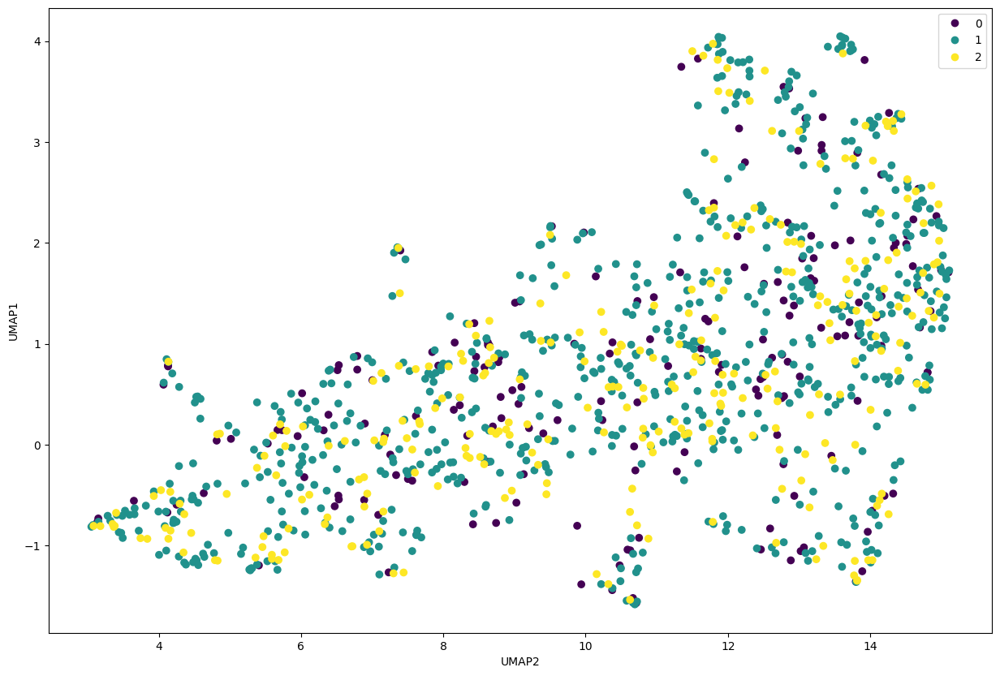

In [56]:
X1_norm0_umap = umap_create_visualize(X1_norm0)

(1165, 2)


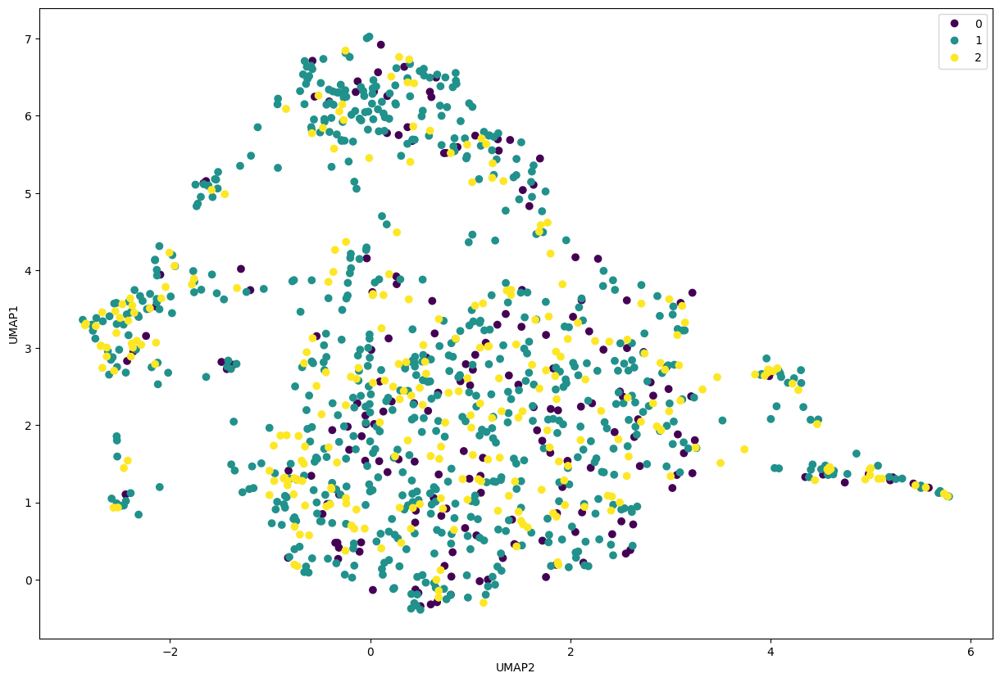

In [76]:
X1_norm1_umap = umap_create_visualize(X1_norm1)

(1165, 2)


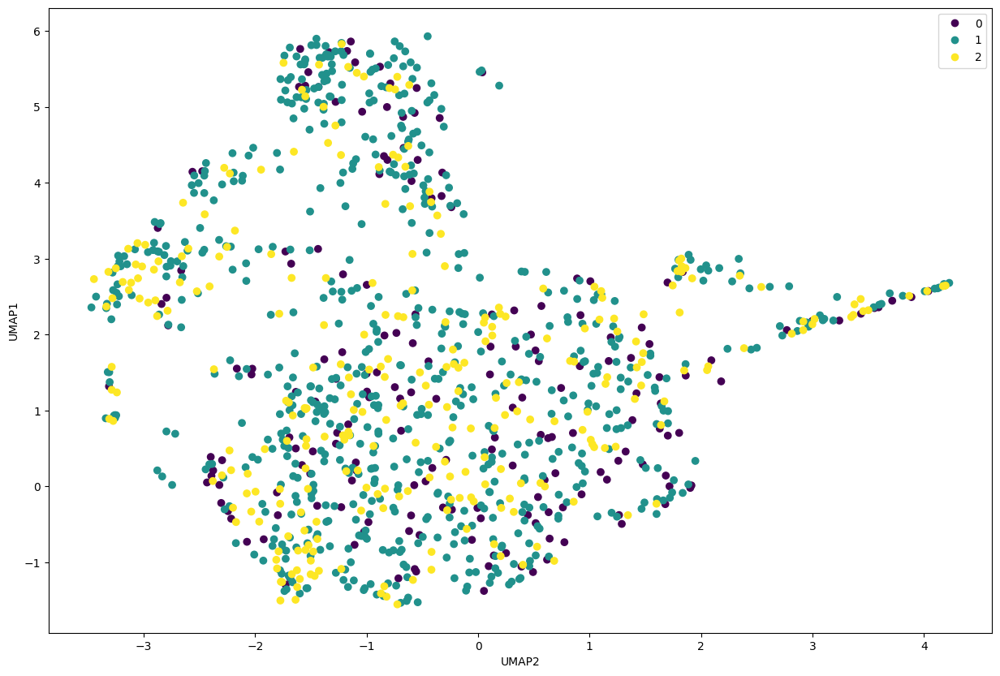

In [77]:
X1_norm2_umap = umap_create_visualize(X1_norm2)

(1165, 2)


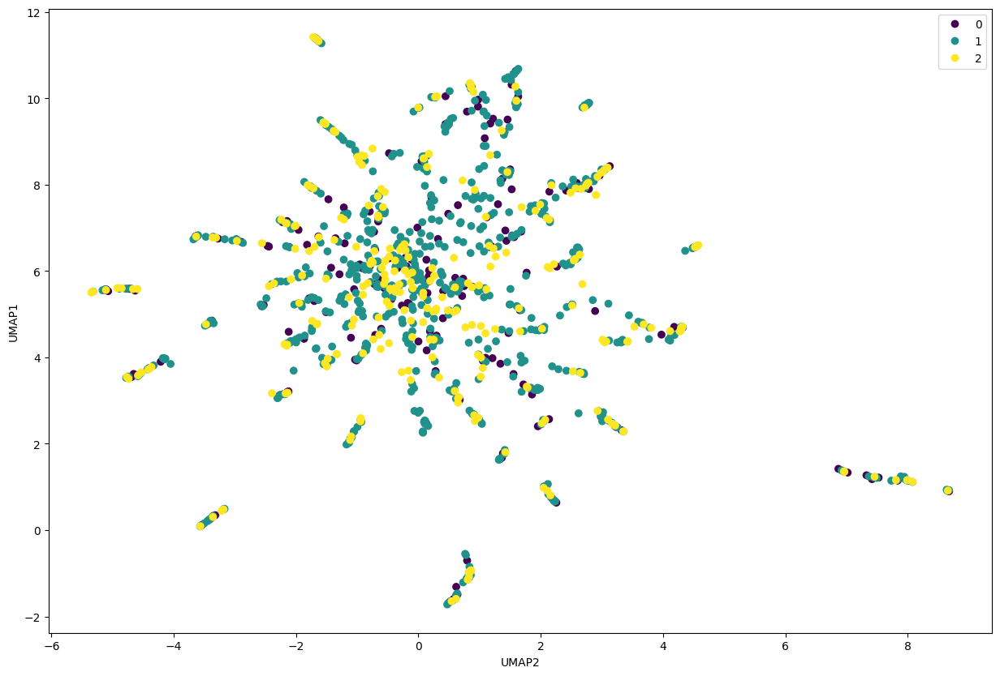

In [78]:
X1_norm3_umap = umap_create_visualize(X1_norm3)

(1165, 2)


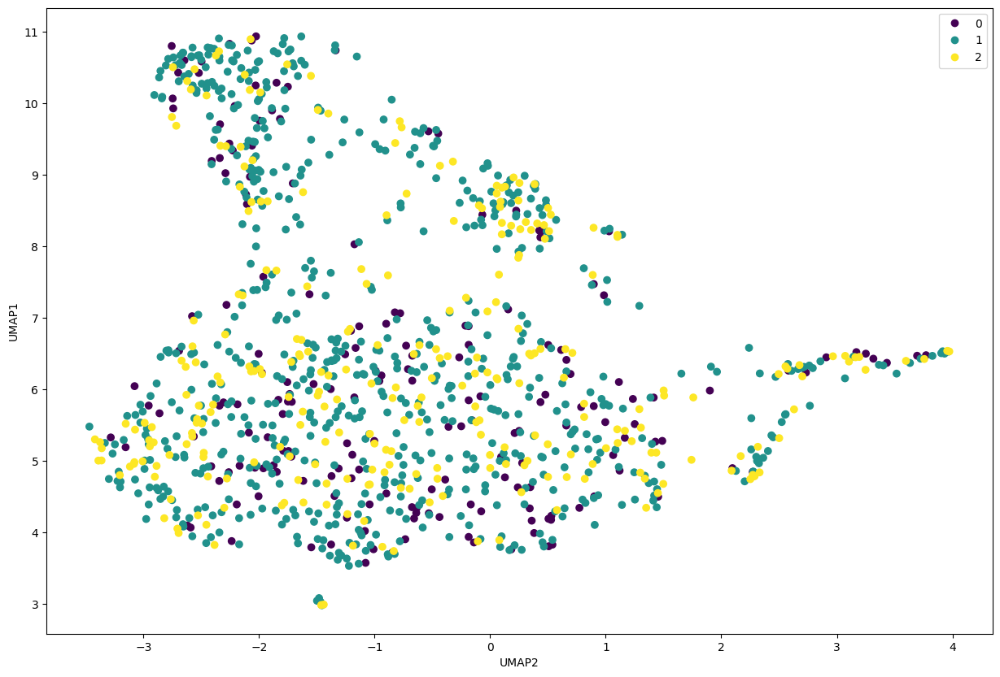

In [79]:
X1_norm4_umap = umap_create_visualize(X1_norm4)

(1165, 2)


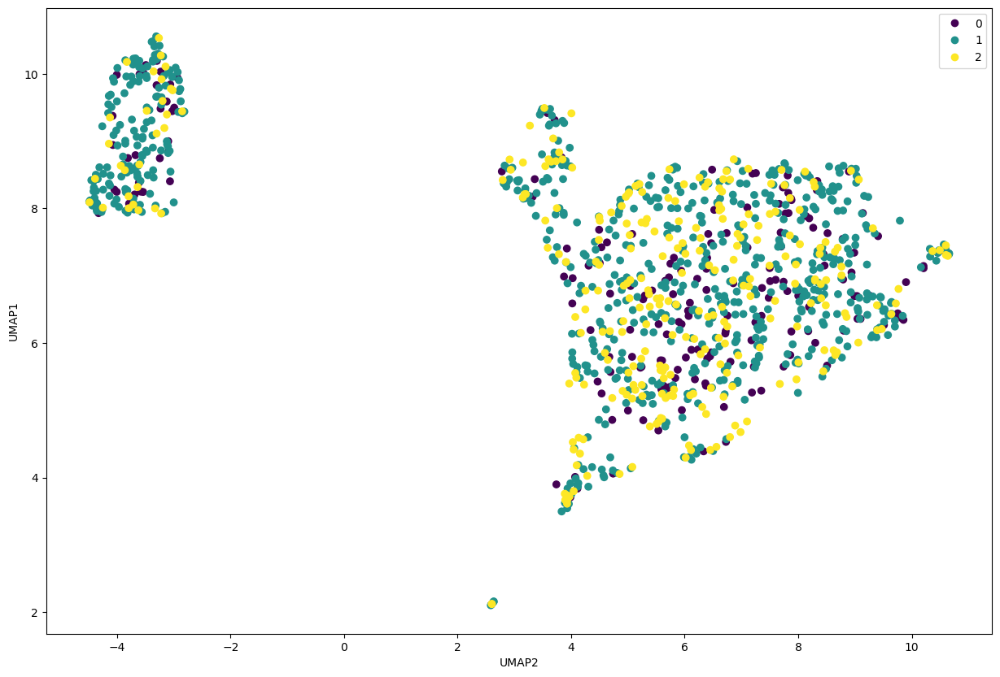

In [80]:
X1_norm5_umap = umap_create_visualize(X1_norm5)

## 1.X.2 Let's do PCA now 

After feature selection with PCA, from 60483 features we left 11 features


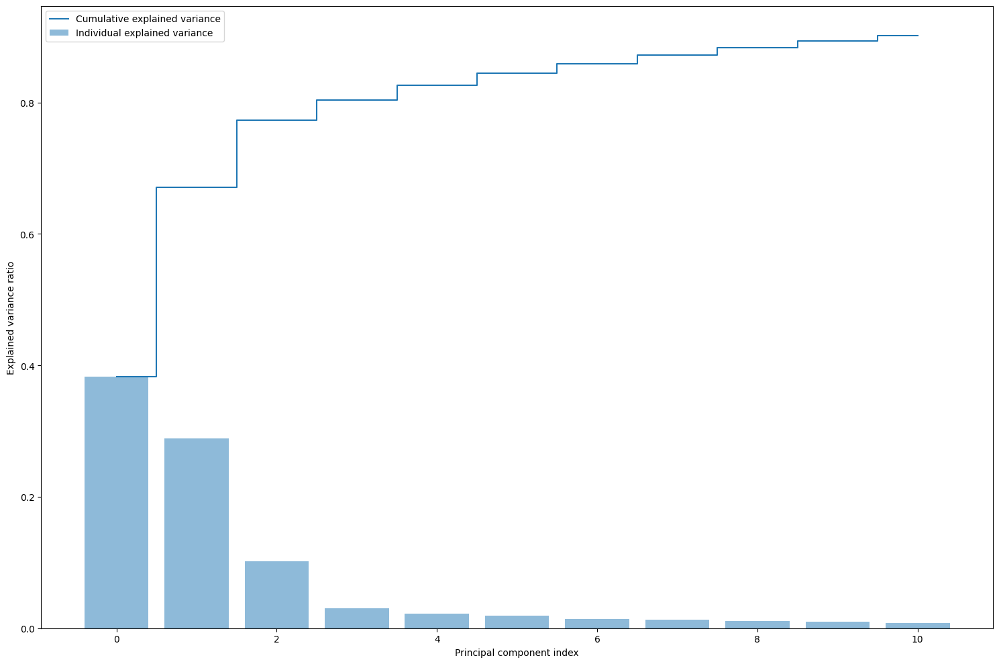

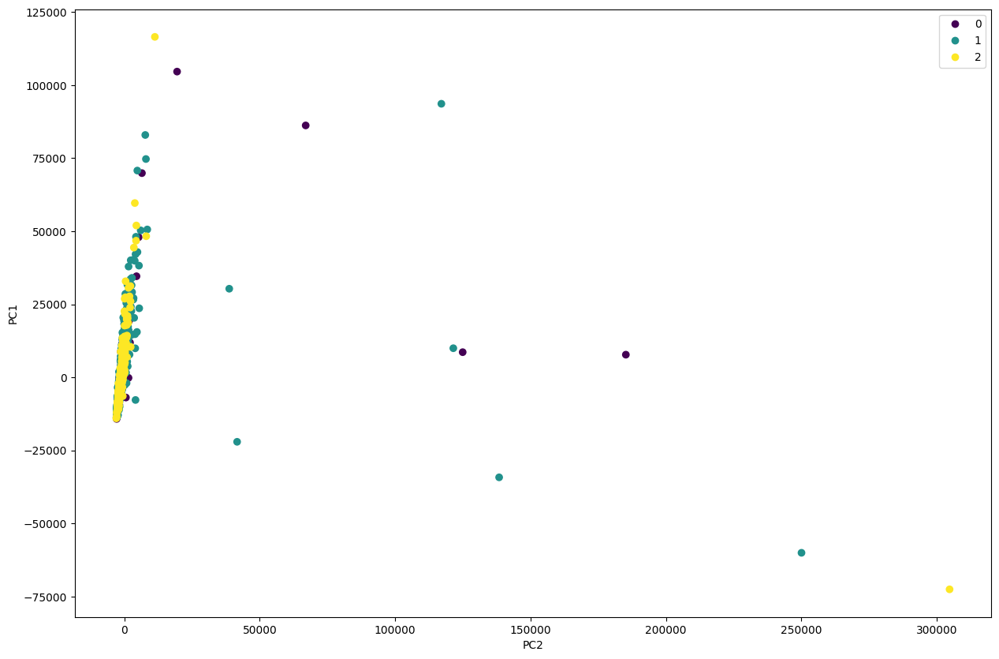

In [58]:
X1_norm0_pca = pca_create_visualize(X1_norm0)

After feature selection with PCA, from 60483 features we left 290 features


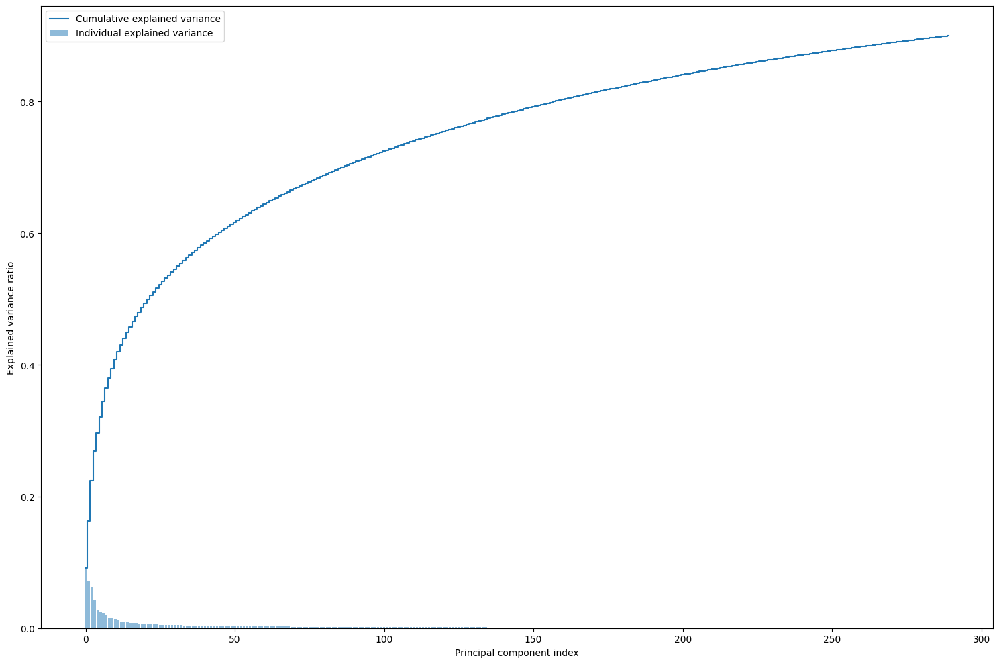

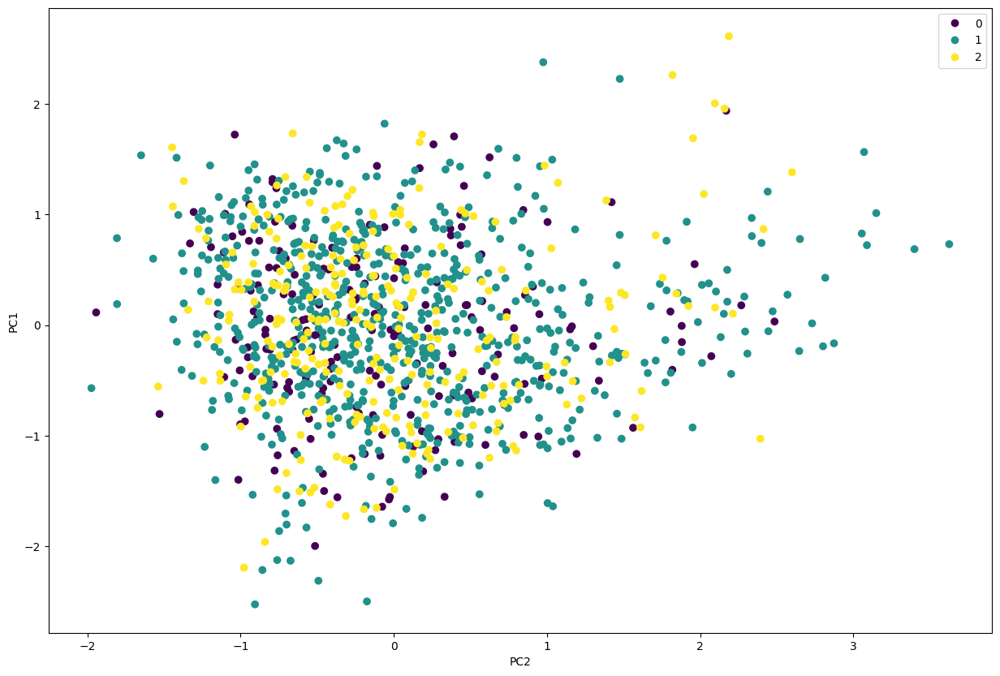

In [81]:
X1_norm1_pca = pca_create_visualize(X1_norm1)

After feature selection with PCA, from 60483 features we left 347 features


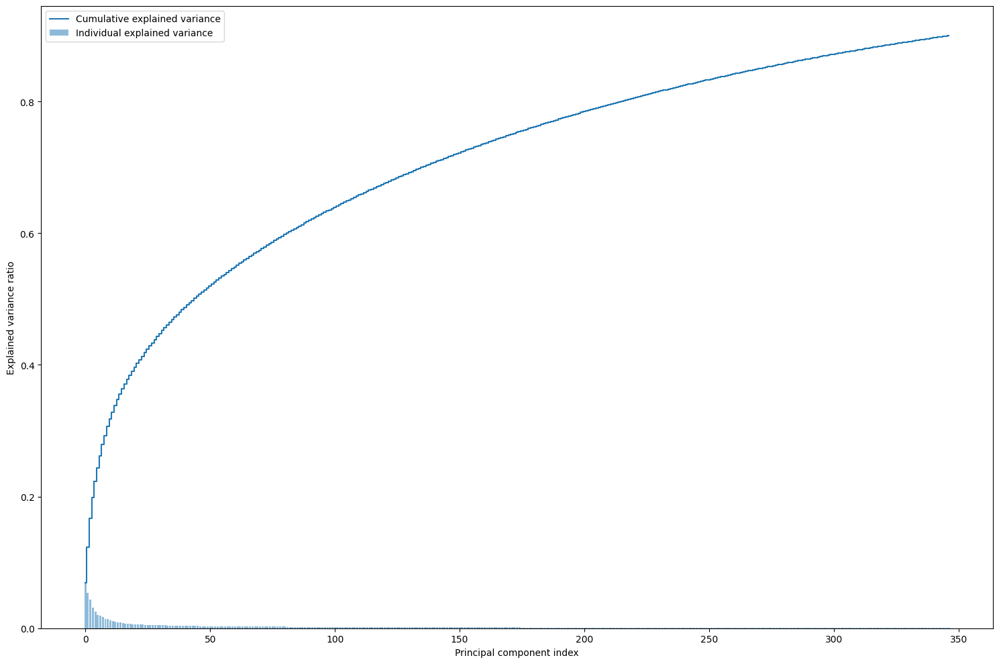

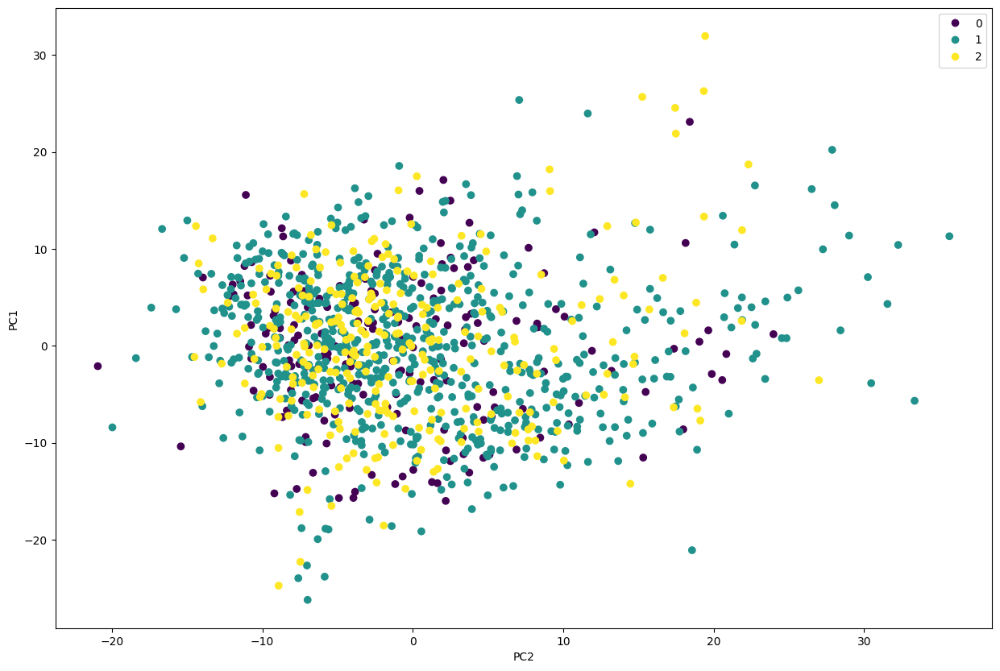

In [82]:
X1_norm2_pca = pca_create_visualize(X1_norm2)

After feature selection with PCA, from 60483 features we left 2 features


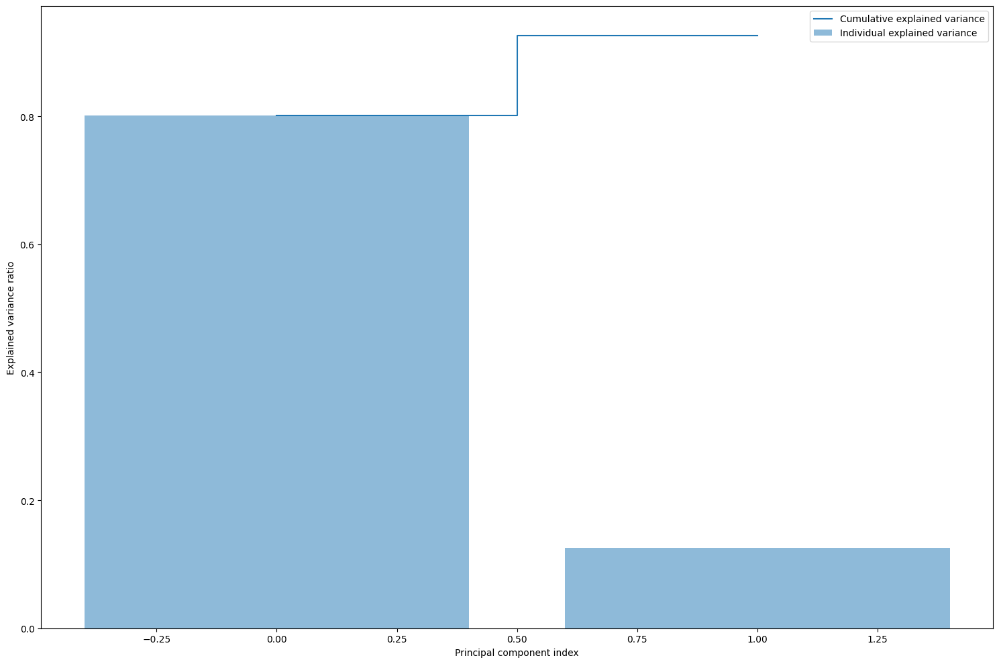

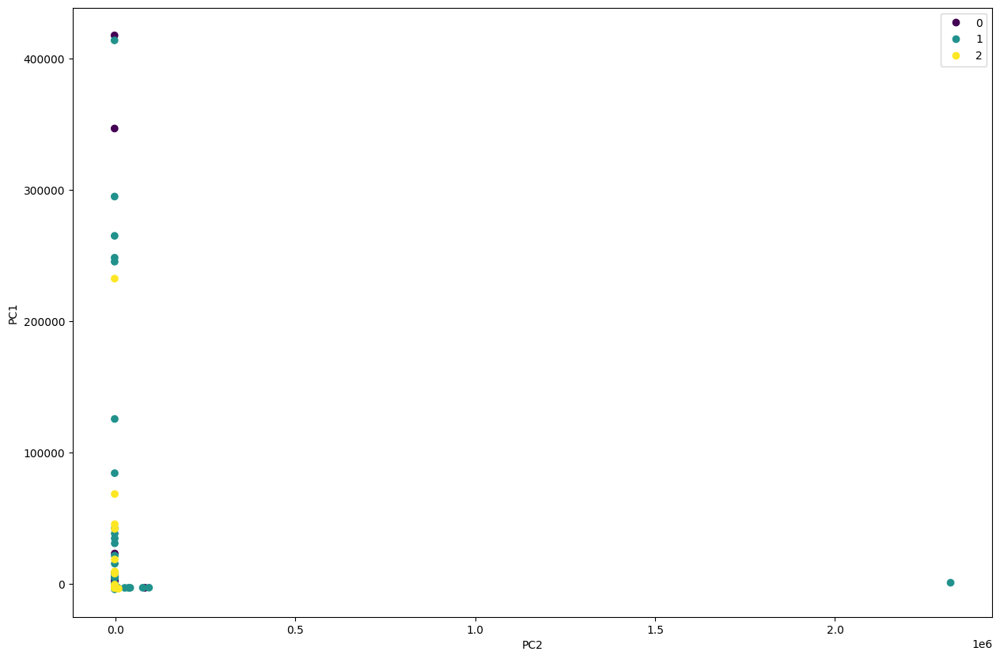

In [83]:
X1_norm3_pca = pca_create_visualize(X1_norm3)

After feature selection with PCA, from 60483 features we left 347 features


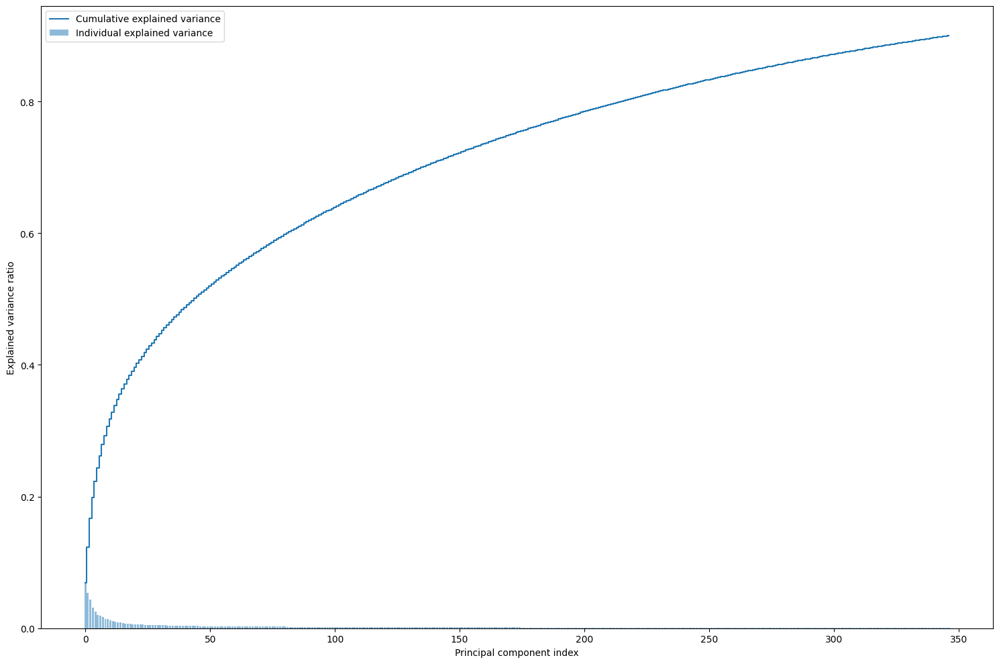

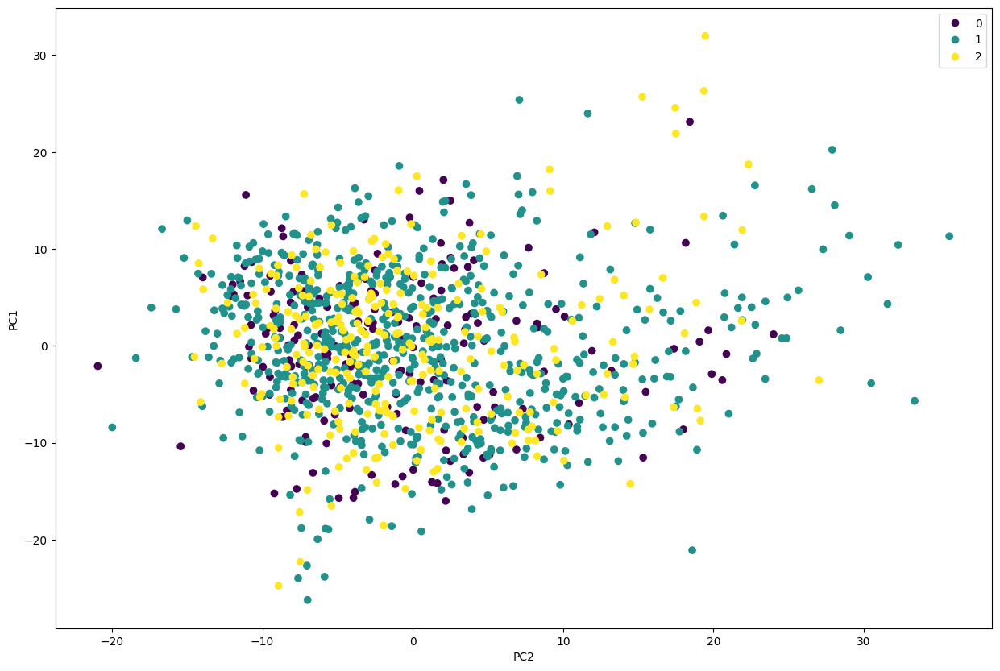

In [84]:
X1_norm4_pca = pca_create_visualize(X1_norm4)

After feature selection with PCA, from 60483 features we left 202 features


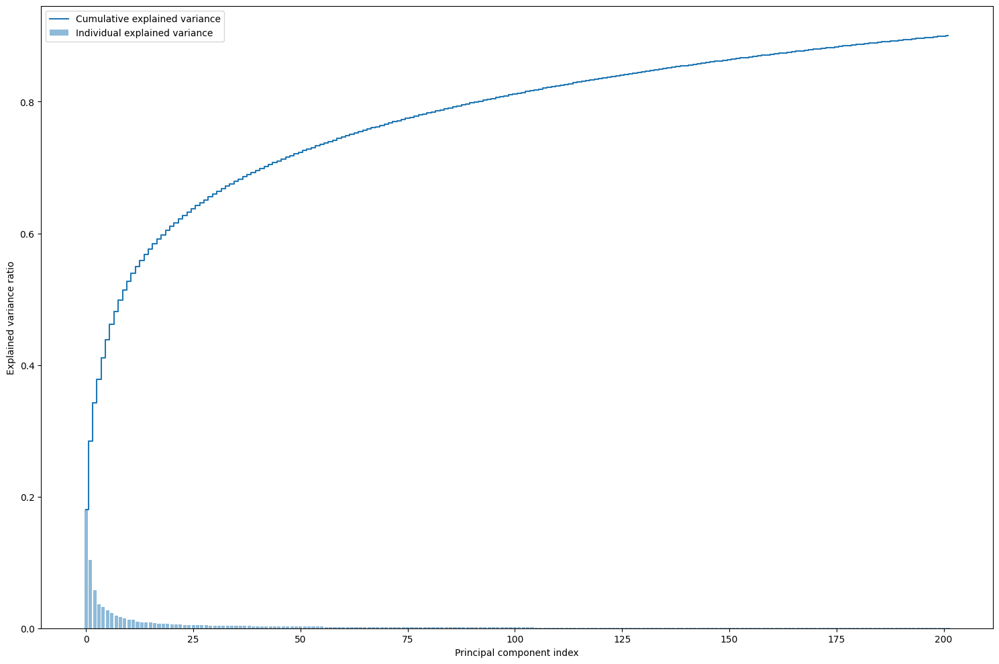

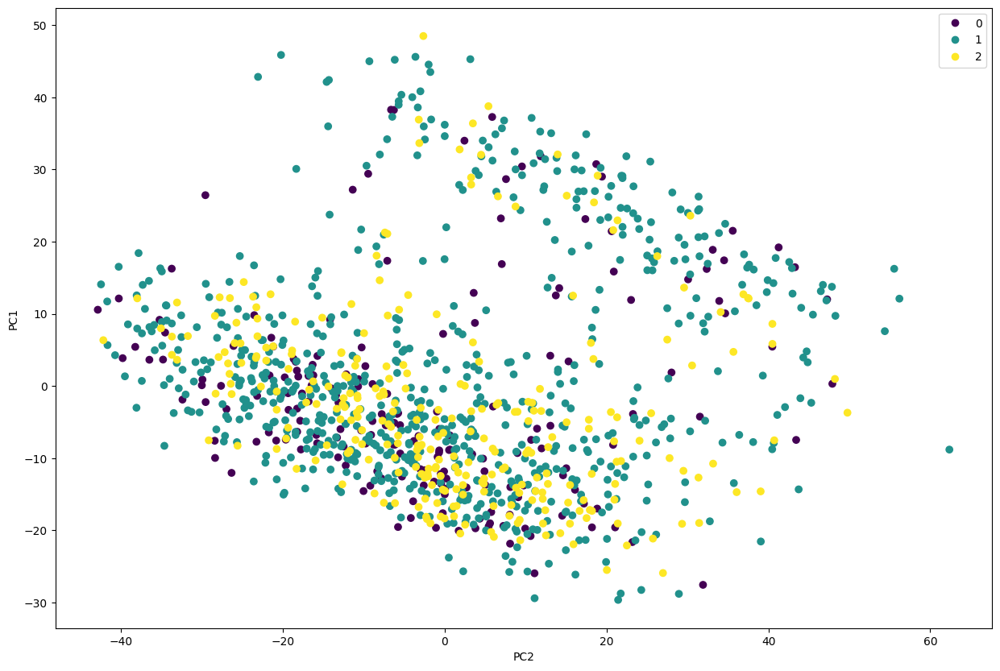

In [85]:
X1_norm5_pca = pca_create_visualize(X1_norm5)

## 2- Feature selection - VarianceThreshold ################### ---------------a

In [86]:
from sklearn.feature_selection import VarianceThreshold

X = VarianceThreshold(threshold=(0.01)).fit_transform(X_initial)

X = pd.DataFrame(X)

## 2.0 - No normalization

In [87]:
%%time

X2_norm0 = X


CPU times: user 1.04 ms, sys: 334 µs, total: 1.37 ms
Wall time: 1.39 ms


## 2.1 Normalization1  - min max normalization

In [88]:
%%time

X2_norm1 = (X - X.min()) /(X.max() - X.min())


CPU times: user 337 ms, sys: 47.3 ms, total: 384 ms
Wall time: 380 ms


## 2.2 Normalization2 - Z-score transformation

In [89]:
X2_norm2 = X.apply(lambda iterator: ((iterator - iterator.mean())/iterator.std()).round(2))

## 2.3 Normalization3 - RobustScaler

In [90]:
from sklearn.preprocessing import RobustScaler

X2_norm3 = RobustScaler().fit_transform(X)

## 2.4 Normalization4 - StandardScaler

In [91]:
from sklearn.preprocessing import StandardScaler


X2_norm4 = StandardScaler().fit_transform(X)

## 2.5 Normalization5 - log2Transform

In [92]:
import numpy as np


X2_norm5 = X.transform(lambda x: np.log2(x + 1))

### Now lest visualize normalization

In [77]:
X2_norm1

,0,1,2,3,4,5,6,7,8,9,...,38698,38699,38700,38701,38702,38703,38704,38705,38706,38707
0,0.095820,0.042091,0.045341,0.185356,0.040327,0.013855,0.273566,0.034441,0.095417,0.037929,...,0.078784,0.109262,0.106309,0.000000,0.019611,0.0,0.0,0.091552,0.033615,0.091672
1,0.060857,0.000087,0.027923,0.225883,0.056409,0.028797,0.049721,0.111418,0.063764,0.032243,...,0.000000,0.045911,0.019453,0.237873,0.045911,0.0,0.0,0.090224,0.042374,0.057779
2,0.159727,0.000474,0.032379,0.330577,0.048448,0.023208,0.057924,0.080016,0.210489,0.033300,...,0.000000,0.071540,0.149878,0.000000,0.206365,0.0,0.0,0.083974,0.000000,0.000000
3,0.066764,0.002656,0.066606,0.336004,0.084078,0.077056,0.049497,0.140191,0.142006,0.032719,...,0.000000,0.025489,0.028800,0.079237,0.009803,0.0,0.0,0.129024,0.000000,0.024058
4,0.127321,0.004733,0.107178,0.188802,0.019220,0.061087,0.094070,0.185335,0.190800,0.026120,...,0.000000,0.045833,0.031288,0.000000,0.021154,0.0,0.0,0.065866,0.000000,0.057682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1160,0.072109,0.000000,0.126848,0.165800,0.074664,0.068603,0.006996,0.118449,0.080483,0.030016,...,0.000000,0.049462,0.030272,0.000000,0.011414,0.0,0.0,0.595249,0.022826,0.000000
1161,0.127002,0.000200,0.109351,0.271715,0.057471,0.025428,0.026332,0.189302,0.072593,0.052291,...,0.000000,0.000000,0.017397,0.054703,0.042638,0.0,0.0,0.027415,0.024361,0.016609
1162,0.015429,0.000483,0.161989,0.364269,0.151829,0.103036,0.121711,0.051667,0.109636,0.066824,...,0.022996,0.106308,0.167164,0.022032,0.124298,0.0,0.0,0.053933,0.000000,0.026758
1163,0.023831,0.001477,0.017152,0.000000,0.006143,0.037039,0.206949,0.087069,0.005671,0.001036,...,0.000000,0.000000,0.000000,0.101006,0.009997,0.0,0.0,0.078219,0.014994,0.582688


In [78]:
X2_norm2

,0,1,2,3,4,5,6,7,8,9,...,38698,38699,38700,38701,38702,38703,38704,38705,38706,38707
0,0.75,0.95,-0.86,-0.68,-0.73,-0.85,2.49,-1.13,-0.48,-0.19,...,1.25,0.23,0.18,-0.53,-0.57,-0.14,-0.16,-0.13,0.08,0.48
1,0.03,-0.15,-1.10,-0.38,-0.50,-0.68,-0.50,0.19,-0.84,-0.31,...,-0.25,-0.44,-0.79,3.58,-0.21,-0.14,-0.16,-0.15,0.21,0.04
2,2.07,-0.14,-1.04,0.42,-0.61,-0.75,-0.39,-0.35,0.84,-0.29,...,-0.25,-0.17,0.67,-0.53,1.98,-0.14,-0.16,-0.23,-0.40,-0.73
3,0.15,-0.08,-0.56,0.46,-0.11,-0.13,-0.50,0.68,0.06,-0.30,...,-0.25,-0.66,-0.69,0.84,-0.70,-0.14,-0.16,0.34,-0.40,-0.41
4,1.40,-0.03,0.02,-0.66,-1.02,-0.31,0.09,1.45,0.62,-0.44,...,-0.25,-0.44,-0.66,-0.53,-0.55,-0.14,-0.16,-0.46,-0.40,0.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1160,0.26,-0.15,0.29,-0.83,-0.24,-0.23,-1.07,0.31,-0.65,-0.36,...,-0.25,-0.40,-0.67,-0.53,-0.68,-0.14,-0.16,6.20,-0.07,-0.73
1161,1.39,-0.15,0.05,-0.03,-0.48,-0.72,-0.81,1.52,-0.74,0.12,...,-0.25,-0.93,-0.82,0.41,-0.25,-0.14,-0.16,-0.94,-0.05,-0.51
1162,-0.91,-0.14,0.79,0.68,0.84,0.17,0.46,-0.84,-0.31,0.43,...,0.19,0.19,0.87,-0.15,0.86,-0.14,-0.16,-0.61,-0.40,-0.37
1163,-0.74,-0.11,-1.26,-2.09,-1.20,-0.59,1.60,-0.23,-1.51,-0.98,...,-0.25,-0.93,-1.01,1.21,-0.70,-0.14,-0.16,-0.30,-0.19,6.98


In [79]:
X2_norm3

array([[ 0.92526028, 18.3507609 , -0.67136566, ...,  0.11540027,
         0.74494838,  1.09883241],
       [ 0.21363548, -0.25059691, -0.95118422, ...,  0.09853334,
         1.03878822,  0.46530356],
       [ 2.22597973, -0.07903825, -0.87959023, ...,  0.01921002,
        -0.38275068, -0.61471796],
       ...,
       [-0.71096561, -0.07505303,  1.20253736, ..., -0.36212556,
        -0.38275068, -0.11455162],
       [-0.53996568,  0.36512595, -1.12421198, ..., -0.05384226,
         0.12026012, 10.27698624],
       [ 0.18210466, -0.11034879, -0.24146843, ..., -0.27134155,
         1.97343993,  0.10133323]])

In [80]:
X2_norm4

array([[ 7.51109672e-01,  9.54857619e-01, -8.58272882e-01, ...,
        -1.34659014e-01,  8.33033501e-02,  4.84978235e-01],
       [ 2.91429256e-02, -1.49322715e-01, -1.10475713e+00, ...,
        -1.51385992e-01,  2.10008407e-01,  3.67543158e-02],
       [ 2.07073229e+00, -1.39138959e-01, -1.04169201e+00, ...,
        -2.30051149e-01, -4.02965537e-01, -7.27364764e-01],
       ...,
       [-9.08895254e-01, -1.38902395e-01,  7.92395289e-01, ...,
        -6.08222677e-01, -4.02965537e-01, -3.73495295e-01],
       [-7.35410214e-01, -1.12773283e-01, -1.25717239e+00, ...,
        -3.02497285e-01, -1.86065023e-01,  6.97855479e+00],
       [-2.84611855e-03, -1.40997559e-01, -4.79588573e-01, ...,
        -5.18191929e-01,  6.13034406e-01, -2.20755992e-01]])

In [182]:
X2_norm5

,0,1,2,3,4,5,6,7,8,9,...,38698,38699,38700,38701,38702,38703,38704,38705,38706,38707
0,4.284965,3.104702,4.387623,2.172132,1.183373,0.714665,4.551933,3.355941,2.328660,3.886960,...,0.435110,0.297339,2.440182,0.000000,0.054695,0.0,0.0,0.937521,0.175089,0.281847
1,3.687641,0.022488,4.050479,2.372432,1.403081,1.084894,2.367693,4.762573,1.968620,3.715758,...,0.000000,0.132473,0.856065,1.038347,0.124932,0.0,0.0,0.927717,0.217424,0.183942
2,4.980664,0.118598,4.144520,2.789135,1.298494,0.957271,2.543890,4.339680,3.178980,3.749138,...,0.000000,0.201455,2.856283,0.000000,0.492205,0.0,0.0,0.880693,0.000000,0.000000
3,3.807534,0.565305,4.714642,2.807772,1.716949,1.876489,2.362558,5.064508,2.734729,3.730878,...,0.000000,0.075043,1.137062,0.434084,0.027600,0.0,0.0,1.189689,0.000000,0.079459
4,4.669516,0.891225,5.186560,2.190288,0.832480,1.659337,3.135195,5.438886,3.064636,3.505372,...,0.000000,0.132260,1.203487,0.000000,0.058910,0.0,0.0,0.735075,0.000000,0.183651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1160,3.908068,0.000000,5.369590,2.064534,1.617630,1.765621,0.739076,4.842396,2.169909,3.642743,...,0.000000,0.142230,1.176736,0.000000,0.032086,0.0,0.0,2.772376,0.121173,0.000000
1161,4.666094,0.051201,5.207959,2.569792,1.416468,1.009312,1.700210,5.467574,2.078398,4.246054,...,0.000000,0.000000,0.786159,0.313077,0.116375,0.0,0.0,0.366392,0.128971,0.055320
1162,2.103779,0.120756,5.647998,2.901142,2.281333,2.172037,3.465343,3.809604,2.465125,4.536459,...,0.141104,0.290056,2.993008,0.134367,0.316031,0.0,0.0,0.630400,0.000000,0.088108
1163,2.557393,0.341222,3.794149,0.522957,0.562639,1.254608,4.170883,4.446030,0.909007,2.018980,...,0.000000,0.000000,0.000000,0.533558,0.028141,0.0,0.0,0.835988,0.080734,1.245712


## 2.X.0 We are not doing dimentionality reduction

We will have: X_norm1, X_norm2, X_norm3, X_norm4

#### X2_norm0

## 2.X.1 Let's do Umap now 

(1165, 2)


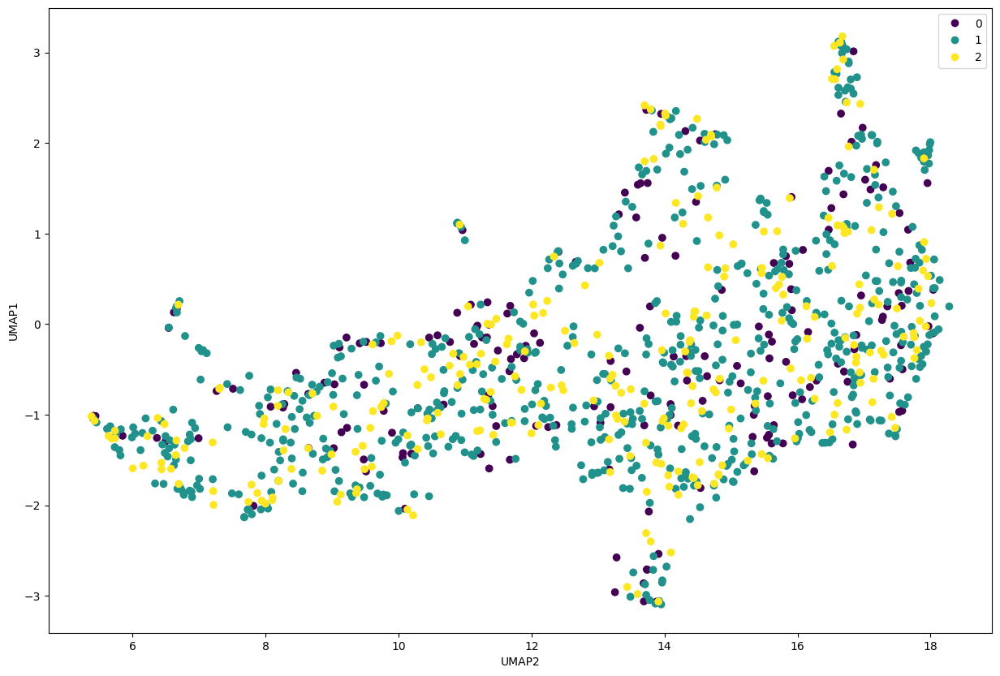

In [93]:
X2_norm0_umap = umap_create_visualize(X2_norm0)

(1165, 2)


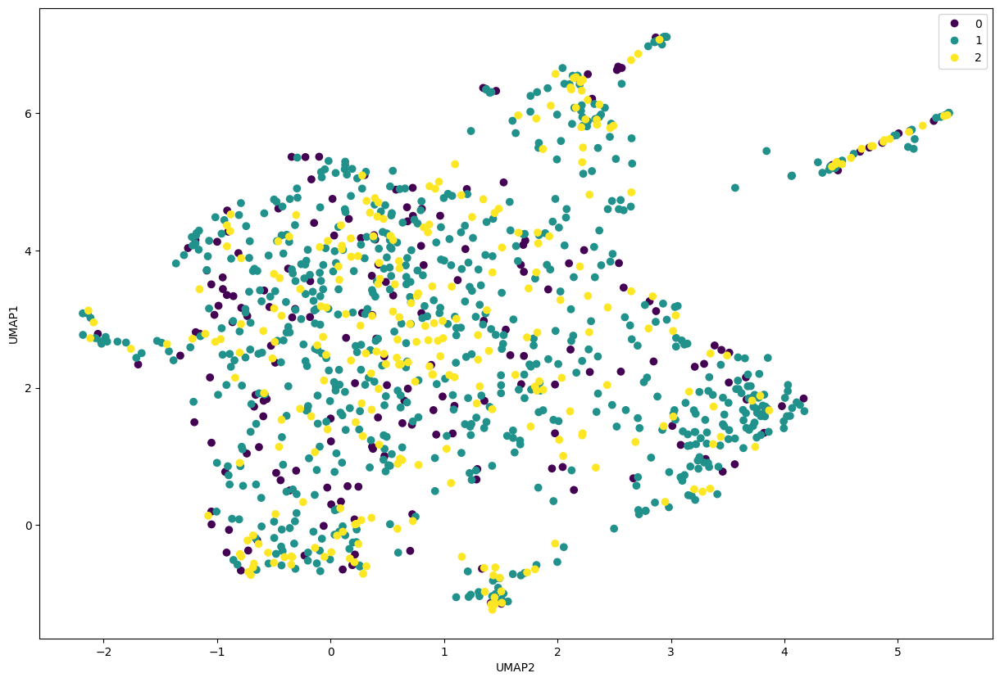

In [94]:
X2_norm1_umap = umap_create_visualize(X2_norm1)

(1165, 2)


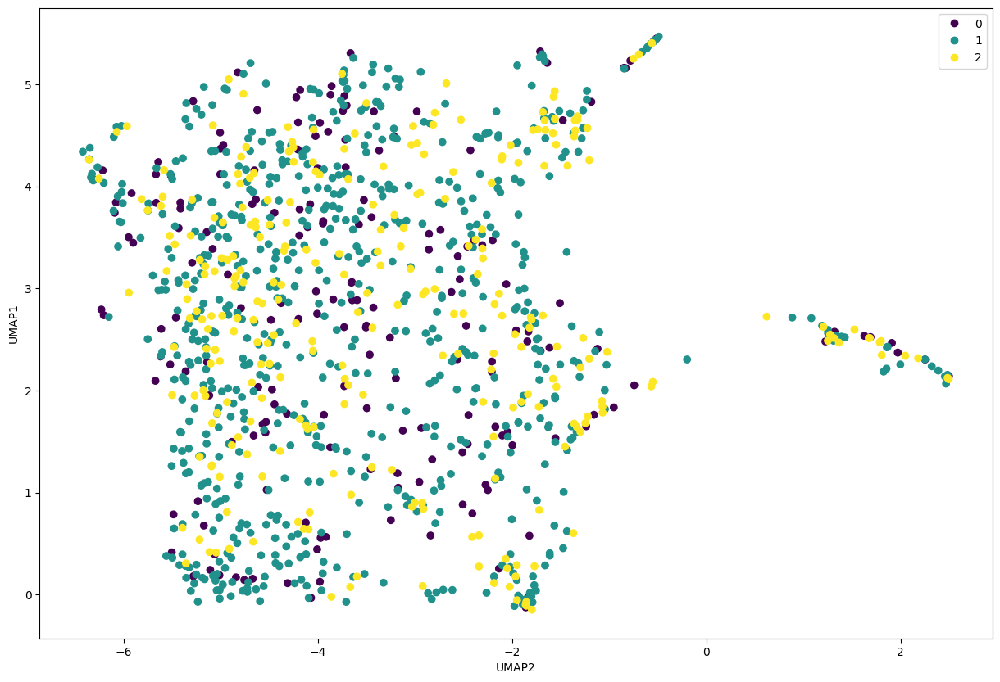

In [95]:
X2_norm2_umap = umap_create_visualize(X2_norm2)

(1165, 2)


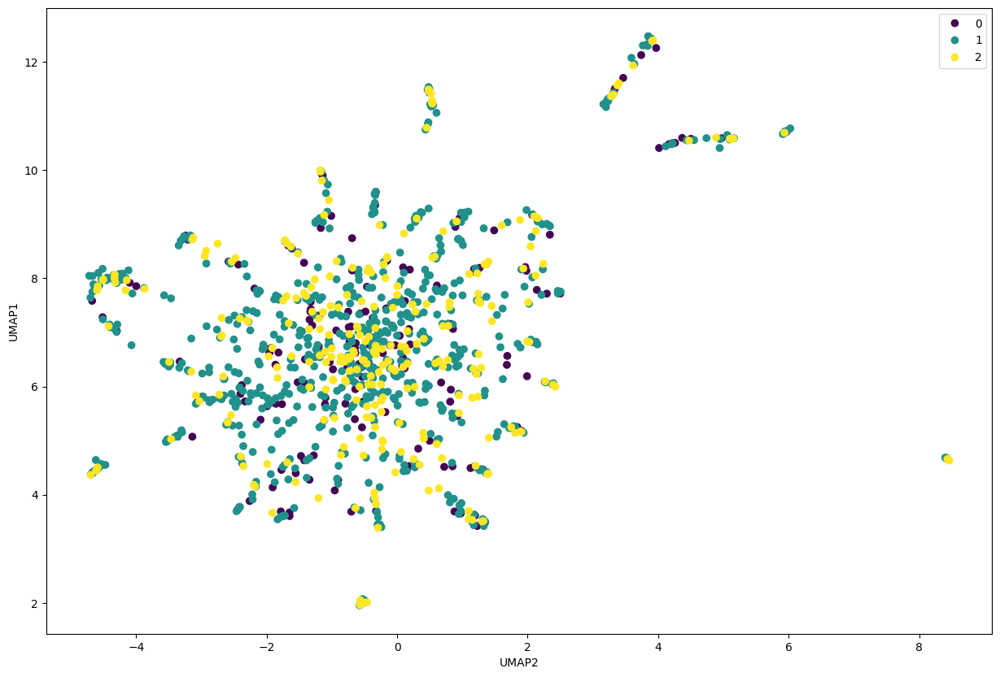

In [96]:
X2_norm3_umap = umap_create_visualize(X2_norm3)

(1165, 2)


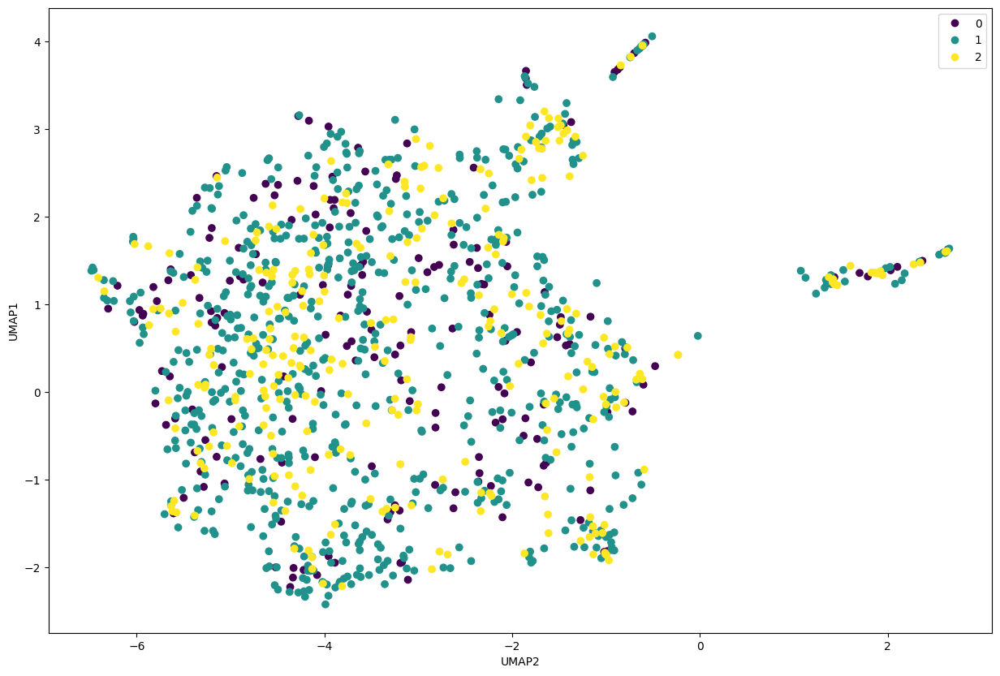

In [97]:
X2_norm4_umap = umap_create_visualize(X2_norm4)

(1165, 2)


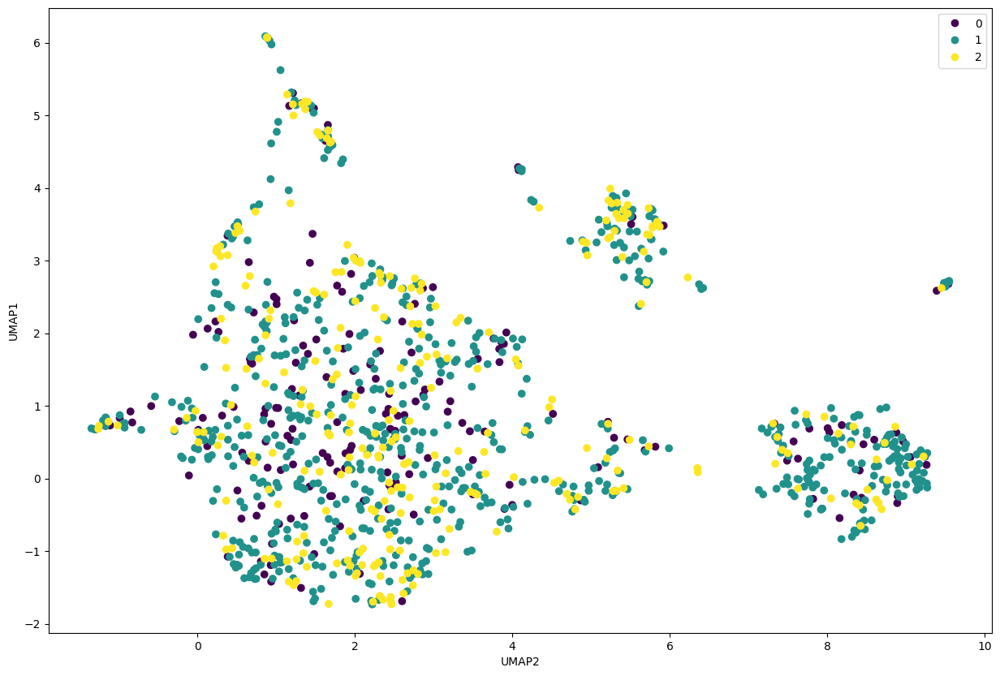

In [98]:
X2_norm5_umap = umap_create_visualize(X2_norm5)

## 1.X.2 Let's do PCA now 

After feature selection with PCA, from 60483 features we left 11 features


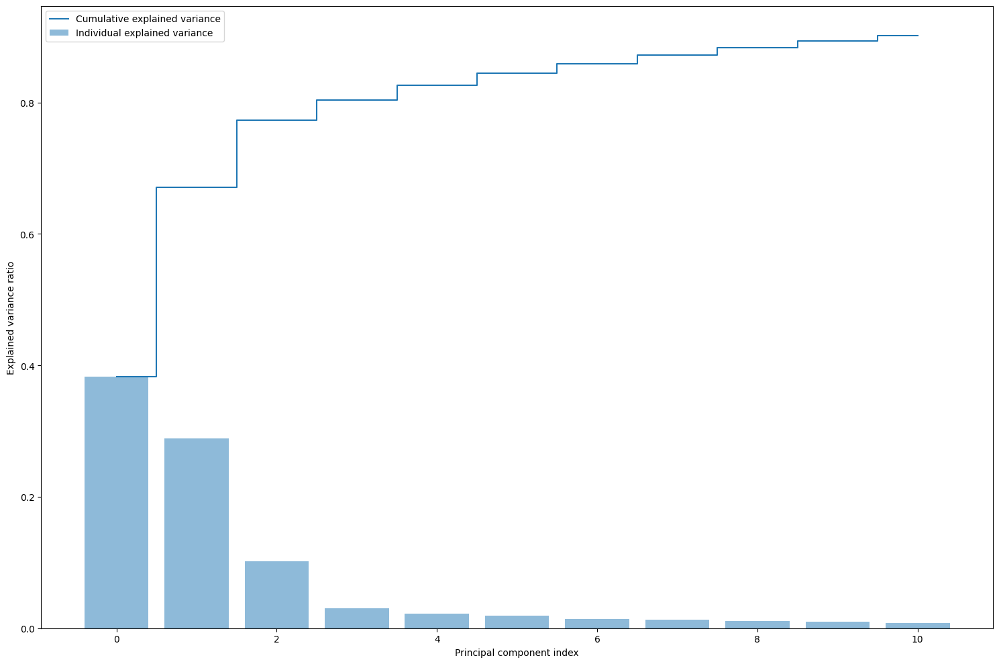

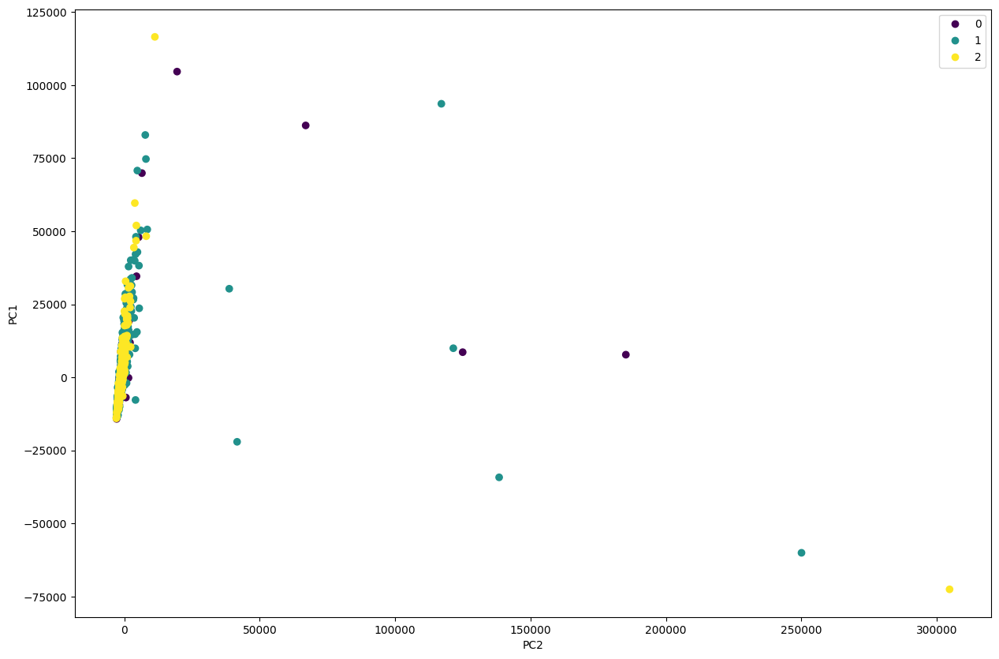

In [99]:
X2_norm0_pca = pca_create_visualize(X2_norm0)

After feature selection with PCA, from 60483 features we left 537 features


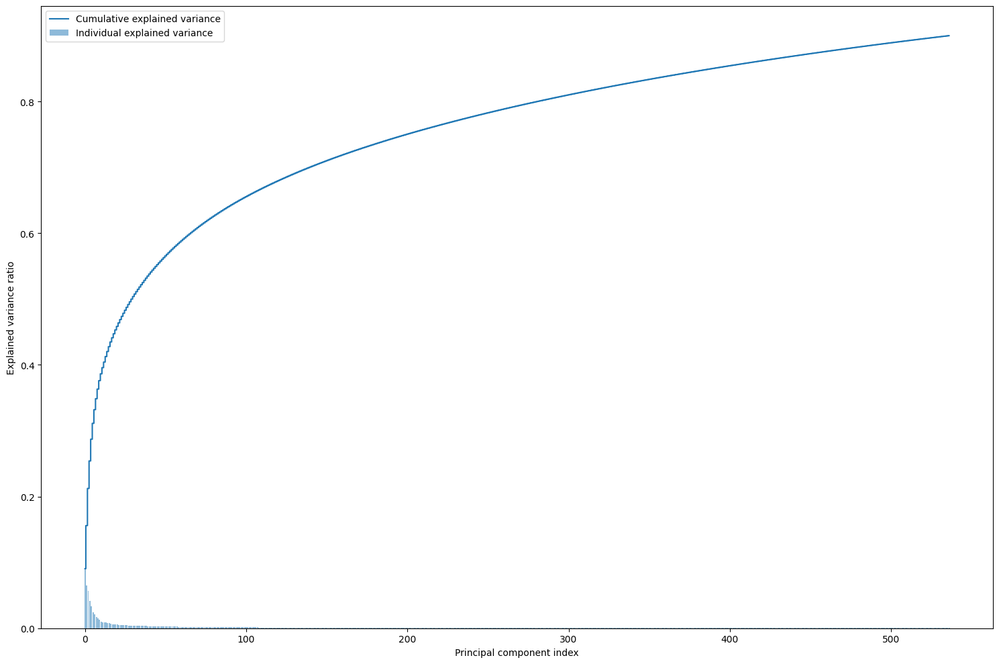

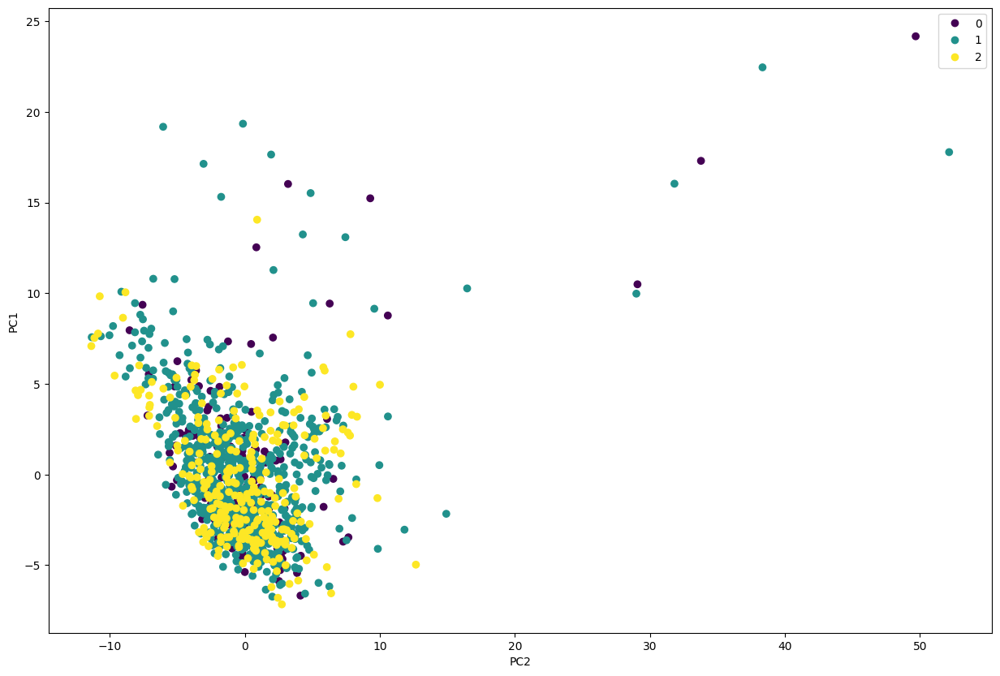

In [100]:
X2_norm1_pca = pca_create_visualize(X2_norm1)

After feature selection with PCA, from 60483 features we left 544 features


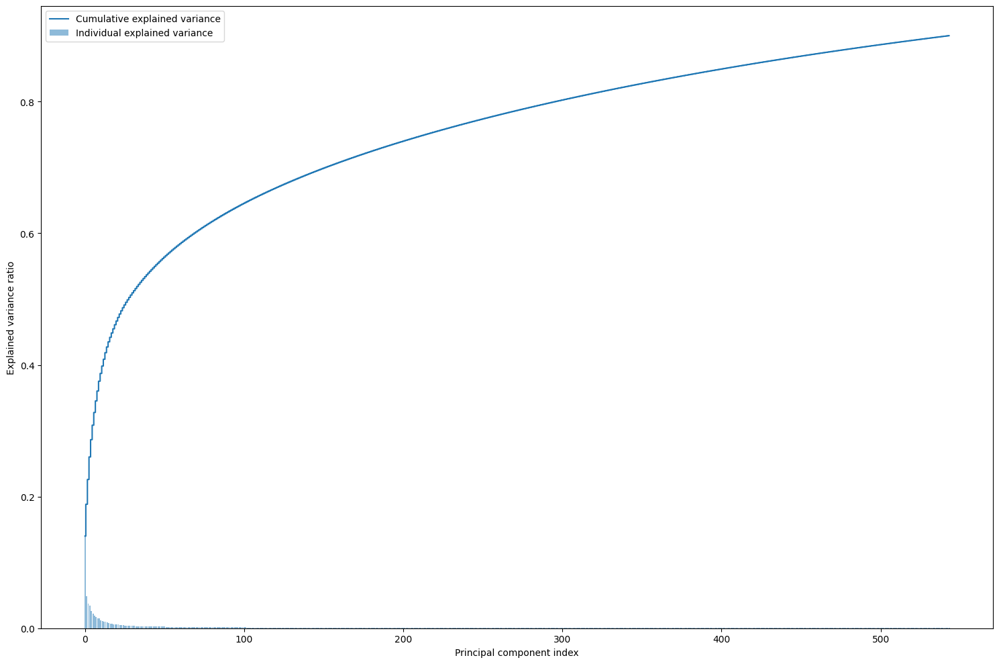

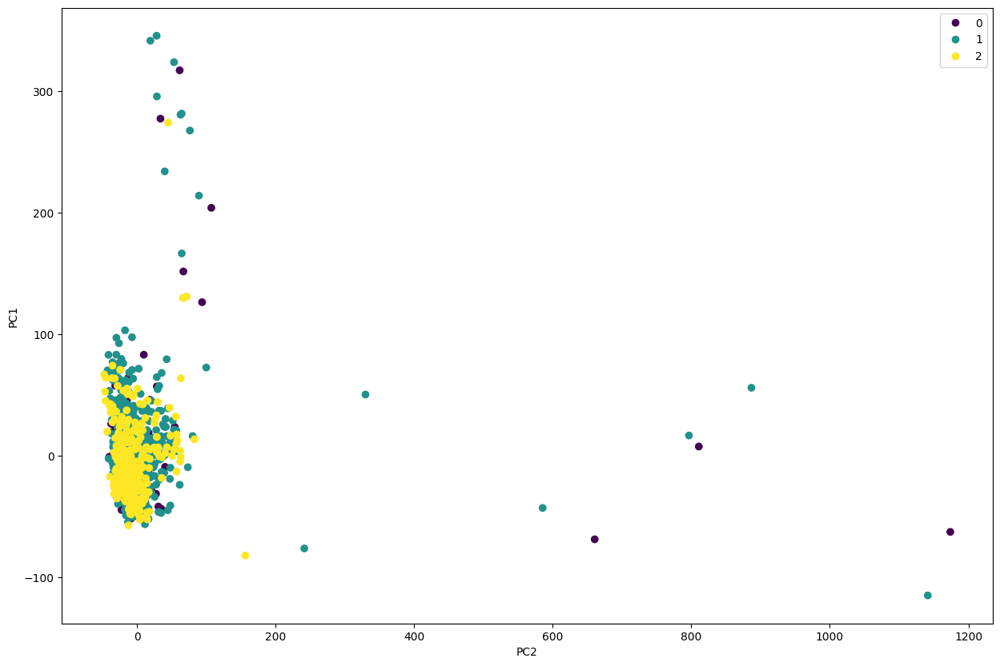

In [101]:
X2_norm2_pca = pca_create_visualize(X2_norm2)

After feature selection with PCA, from 60483 features we left 2 features


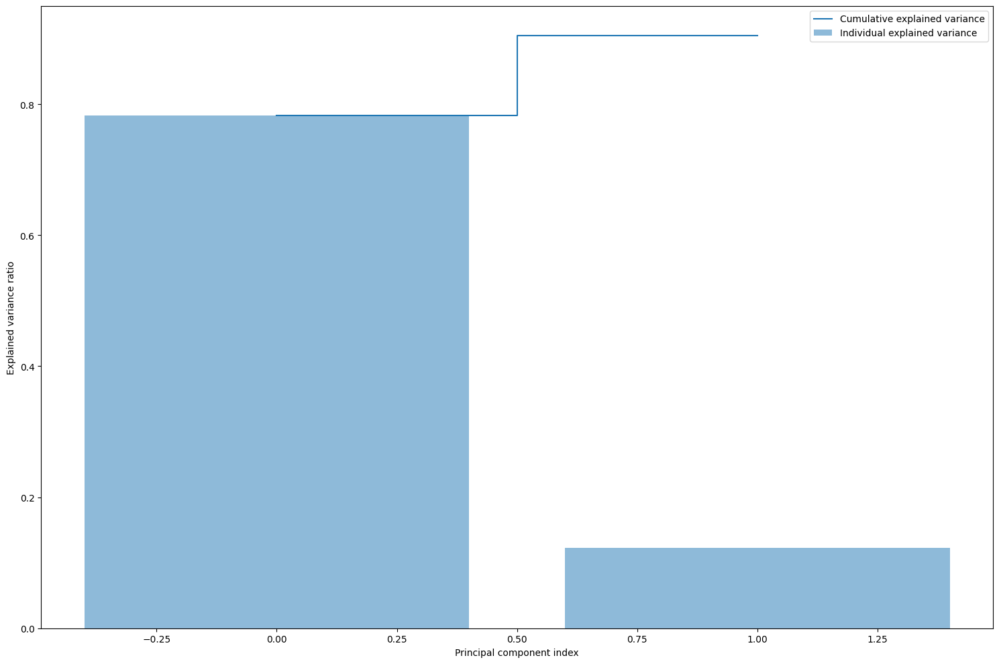

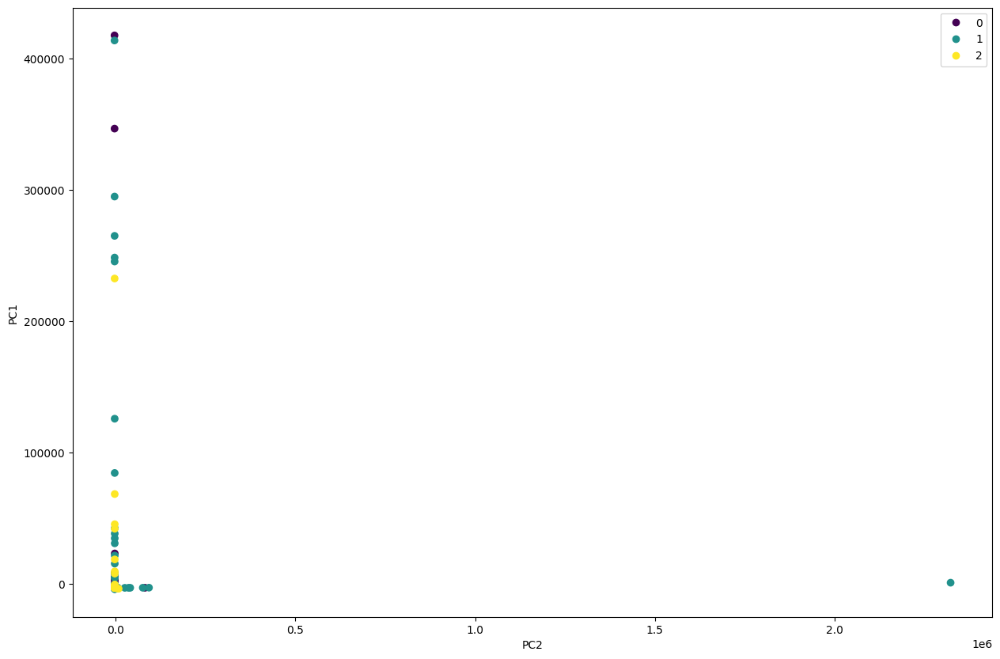

In [102]:
X2_norm3_pca = pca_create_visualize(X2_norm3)

After feature selection with PCA, from 60483 features we left 544 features


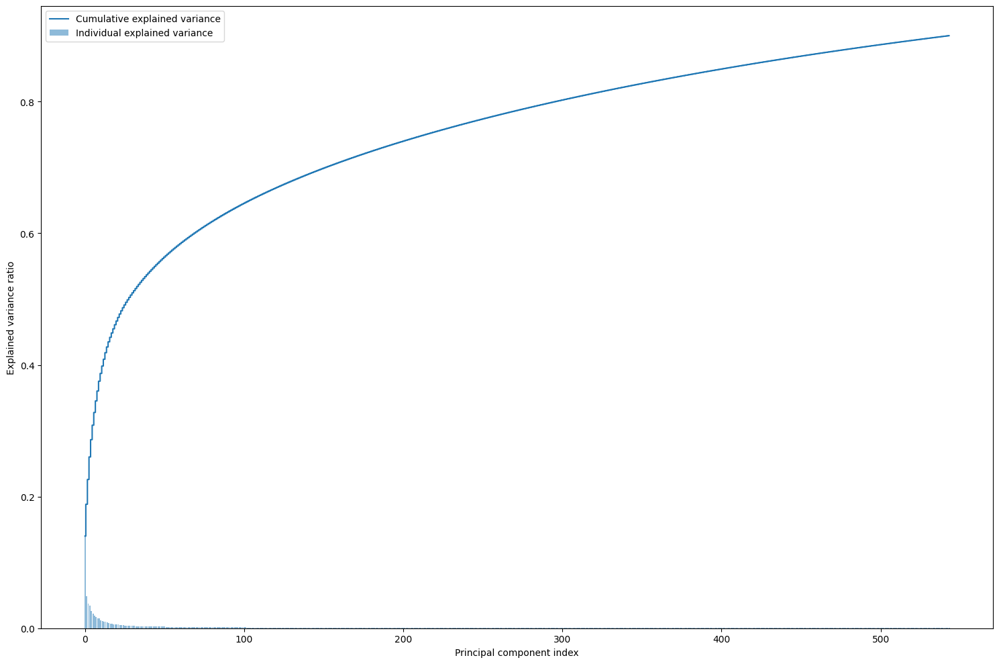

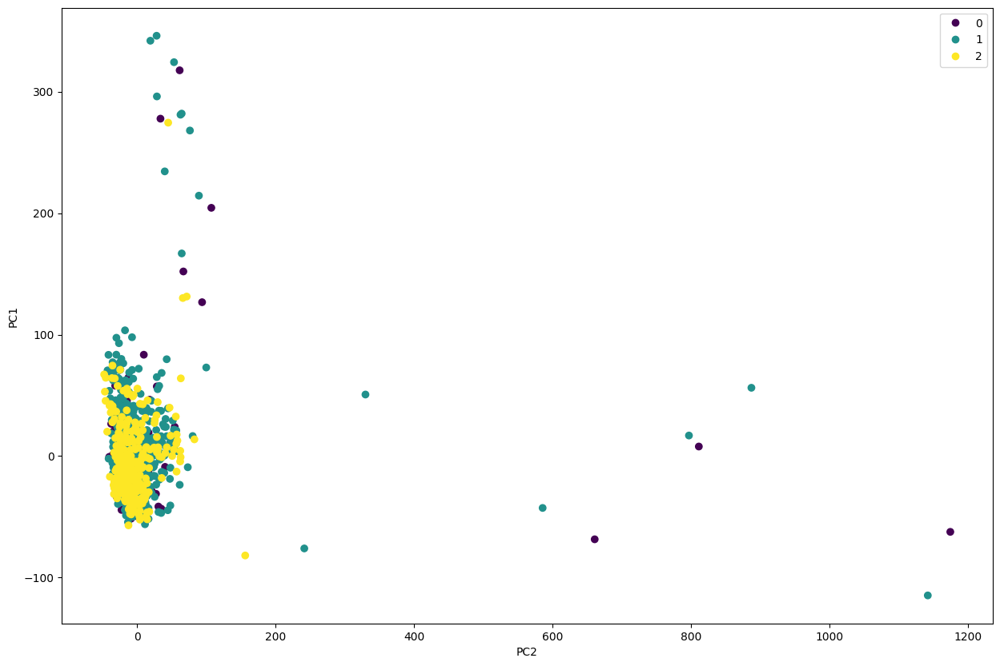

In [103]:
X2_norm4_pca = pca_create_visualize(X2_norm4)

After feature selection with PCA, from 60483 features we left 464 features


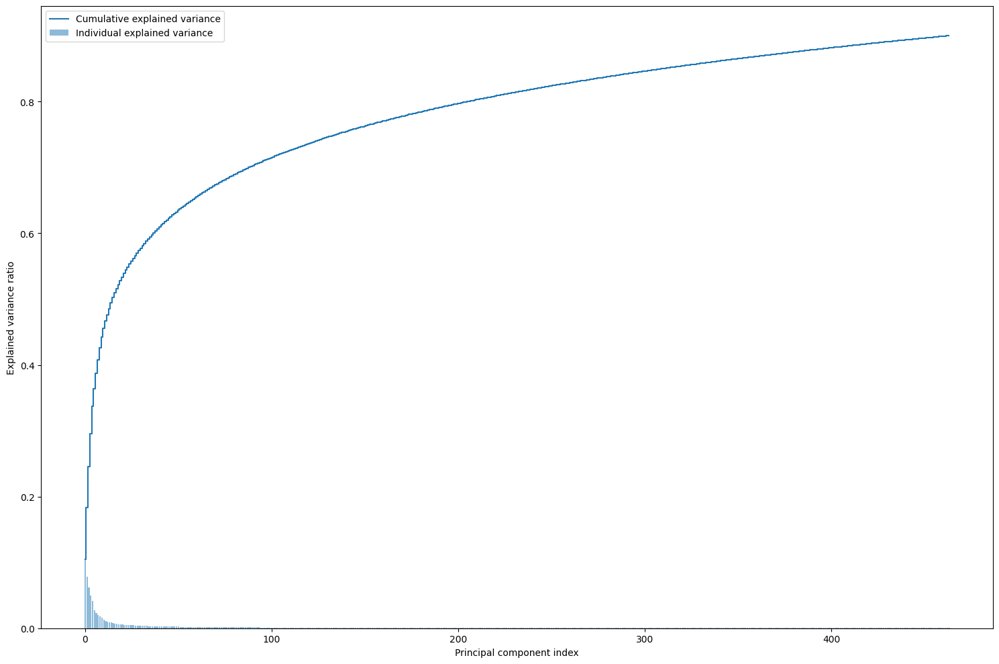

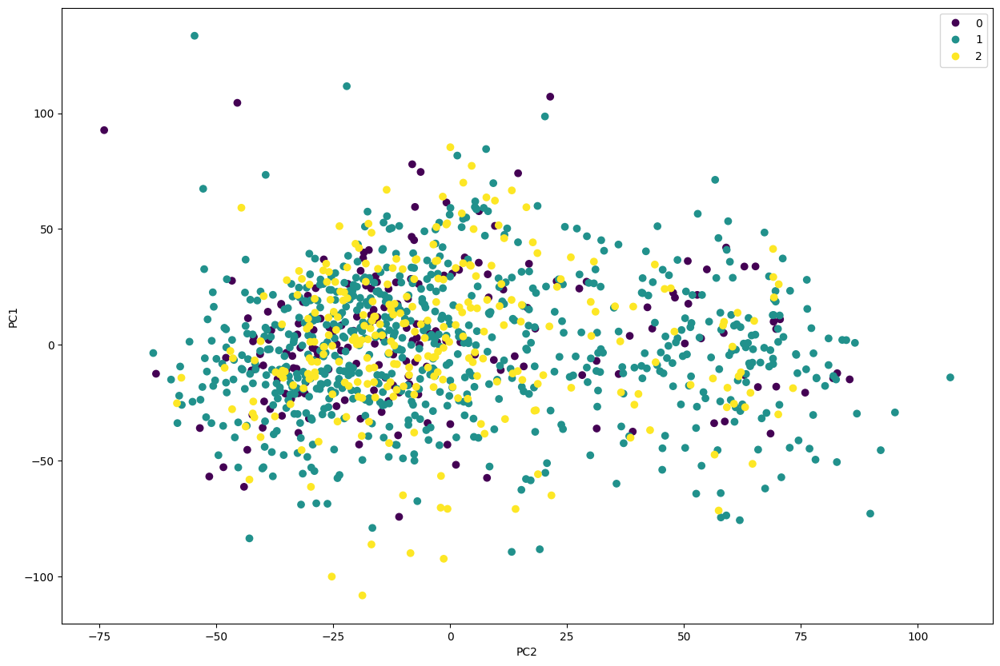

In [104]:
X2_norm5_pca = pca_create_visualize(X2_norm5)

## 3- Feature selection - Univariate feature selection ################### ---------------a

In [63]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


X = SelectKBest(chi2).fit_transform(X_initial, y_initial)

X = pd.DataFrame(X)


## 3.0 - No normalization

In [64]:
%%time

X3_norm0 = X


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.81 µs


## 3.1 Normalization1  - min max normalization

In [106]:
%%time

X3_norm1 = (X - X.min()) /(X.max() - X.min())


CPU times: user 315 ms, sys: 54.1 ms, total: 369 ms
Wall time: 368 ms


## 3.2 Normalization2 - ?  Standard ??

In [107]:
X3_norm2 = X.apply(lambda iterator: ((iterator - iterator.mean())/iterator.std()).round(2))

## 3.3 Normalization3 - RobustScaler

In [108]:
from sklearn.preprocessing import RobustScaler

X3_norm3 = RobustScaler().fit_transform(X)

## 3.4 Normalization4 - StandardScaler

In [109]:
from sklearn.preprocessing import StandardScaler


X3_norm4 = StandardScaler().fit_transform(X)

## 3.5 Normalization5 - log2Transform

In [110]:
import numpy as np


X3_norm5 = X.transform(lambda x: np.log2(x + 1))

### Now lest visualize normalization

In [109]:
X3_norm1

,0,1,2,3,4,5,6,7,8,9
0,2.364812e-04,4.731726e-07,5.388669e-05,0.000020,0.036534,0.000021,0.009186,0.002291,0.000694,0.000103
1,7.583248e-05,1.192930e-06,0.000000e+00,0.000014,0.030744,0.000092,0.091634,0.025407,0.000357,0.000052
2,8.149313e-07,0.000000e+00,6.106590e-06,0.000005,0.226389,0.000013,0.039749,0.009198,0.004092,0.000046
3,4.239097e-05,0.000000e+00,1.611627e-07,0.002509,0.055391,0.000020,0.017827,0.002894,0.000752,0.000049
4,3.759139e-05,0.000000e+00,5.864092e-01,0.000073,0.065994,0.000019,0.041475,0.010270,0.001608,0.000029
...,...,...,...,...,...,...,...,...,...,...
1160,1.239558e-05,0.000000e+00,0.000000e+00,0.000019,0.108929,0.000007,0.056588,0.012587,0.001737,0.000043
1161,8.876993e-03,1.714583e-07,4.706345e-05,0.000128,0.031611,0.000081,0.019649,0.004638,0.000249,0.000720
1162,1.768040e-05,0.000000e+00,1.599780e-05,0.000026,0.077571,0.000022,0.010739,0.003127,0.004324,0.000047
1163,0.000000e+00,0.000000e+00,1.150450e-05,0.000002,0.030611,0.000061,0.004071,0.002582,0.000103,0.000313


In [111]:
X3_norm2

,0,1,2,3,4,5,6,7,8,9
0,-0.17,-0.03,-0.21,-0.11,-0.39,-0.08,-0.43,-0.15,-0.11,-0.07
1,-0.17,-0.03,-0.21,-0.11,-0.50,-0.08,1.35,0.39,-0.12,-0.07
2,-0.17,-0.03,-0.21,-0.11,3.04,-0.08,0.23,0.01,-0.02,-0.07
3,-0.17,-0.03,-0.21,-0.04,-0.05,-0.08,-0.24,-0.14,-0.11,-0.07
4,-0.17,-0.03,6.07,-0.11,0.14,-0.08,0.27,0.03,-0.08,-0.07
...,...,...,...,...,...,...,...,...,...,...
1160,-0.17,-0.03,-0.21,-0.11,0.92,-0.08,0.59,0.09,-0.08,-0.07
1161,0.09,-0.03,-0.21,-0.11,-0.48,-0.08,-0.20,-0.10,-0.12,-0.05
1162,-0.17,-0.03,-0.21,-0.11,0.35,-0.08,-0.40,-0.13,-0.01,-0.07
1163,-0.17,-0.03,-0.21,-0.11,-0.50,-0.08,-0.54,-0.15,-0.12,-0.06


In [113]:
X3_norm3

array([[ 3.64920876e-02,  3.76449679e-02,  5.25499284e-02, ...,
        -4.39642092e-01, -4.28149622e-01, -3.34168758e-01],
       [-5.86226198e-02,  9.49079204e-02, -8.30129873e-02, ...,
         4.70812266e+00, -6.16597263e-01, -4.91134227e-01],
       [-1.03037995e-01,  0.00000000e+00, -6.76506213e-02, ...,
         1.09860788e+00,  1.47146819e+00, -5.11030999e-01],
       ...,
       [-9.30525143e-02,  0.00000000e+00, -4.27672780e-02, ...,
        -2.53417022e-01,  1.60126756e+00, -5.07232006e-01],
       [-1.03520488e-01,  0.00000000e+00, -5.40710790e-02, ...,
        -3.74809754e-01, -7.58516884e-01,  3.14049531e-01],
       [ 4.40589613e+00,  0.00000000e+00,  4.70883053e-01, ...,
         7.20511997e-04, -4.86562421e-01,  7.94073961e-01]])

In [114]:
X3_norm4

array([[-0.16587162, -0.03029732, -0.20680965, ..., -0.1545231 ,
        -0.10817021, -0.06638045],
       [-0.17057381, -0.03027274, -0.20738679, ...,  0.38808378,
        -0.11691184, -0.06761816],
       [-0.17276958, -0.03031347, -0.20732139, ...,  0.00761815,
        -0.02005149, -0.06777505],
       ...,
       [-0.17227593, -0.03031347, -0.20721545, ..., -0.13489381,
        -0.01403041, -0.0677451 ],
       [-0.17279343, -0.03031347, -0.20726357, ..., -0.14768937,
        -0.12349515, -0.06126907],
       [ 0.05013908, -0.03031347, -0.20502867, ..., -0.10810611,
        -0.11087984, -0.05748394]])

## 3.X.0 We are not doing dimentionality reduction

We will have: X_norm1, X_norm2, X_norm3, X_norm4

## 3.X.1 Let's do Umap now 

(1165, 2)


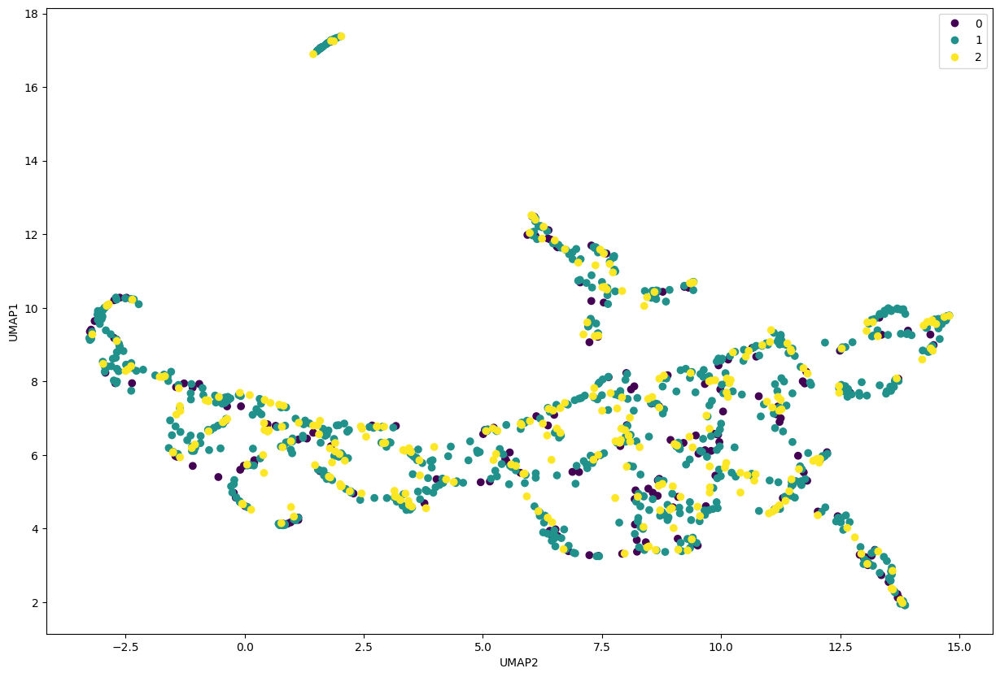

In [111]:
X3_norm0_umap = umap_create_visualize(X3_norm0)

(1165, 2)


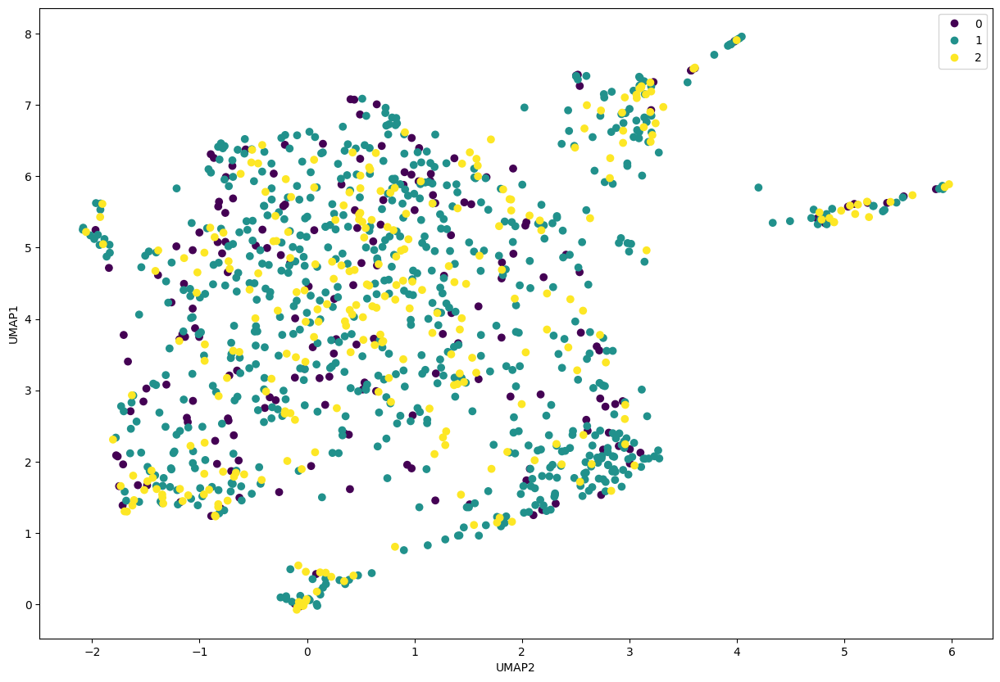

In [112]:
X3_norm1_umap = umap_create_visualize(X3_norm1)

(1165, 2)


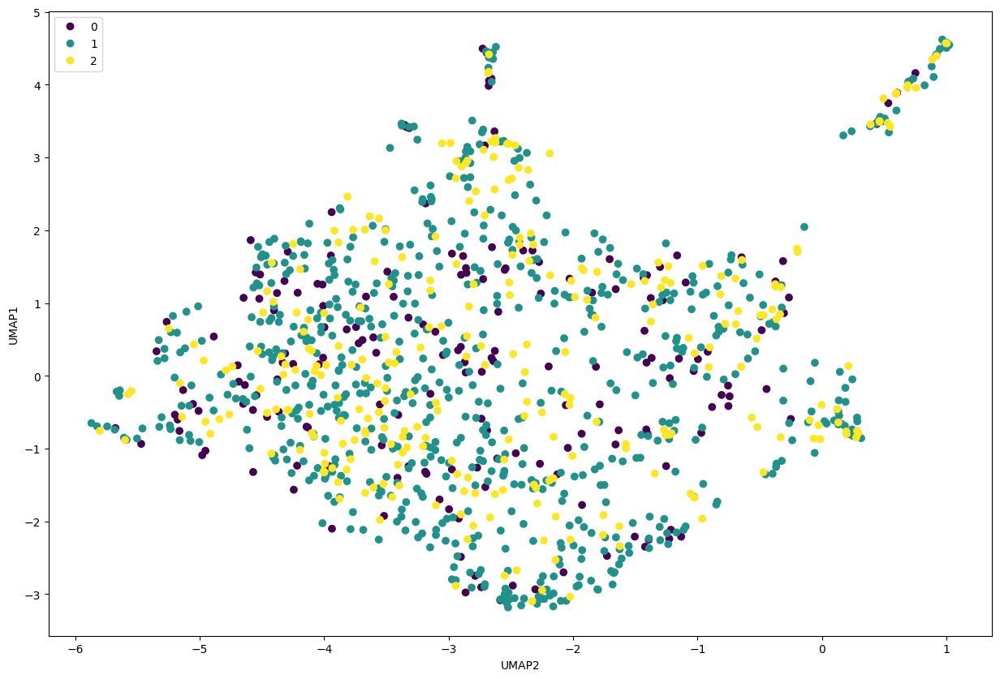

In [113]:
X3_norm2_umap = umap_create_visualize(X3_norm2)

(1165, 2)


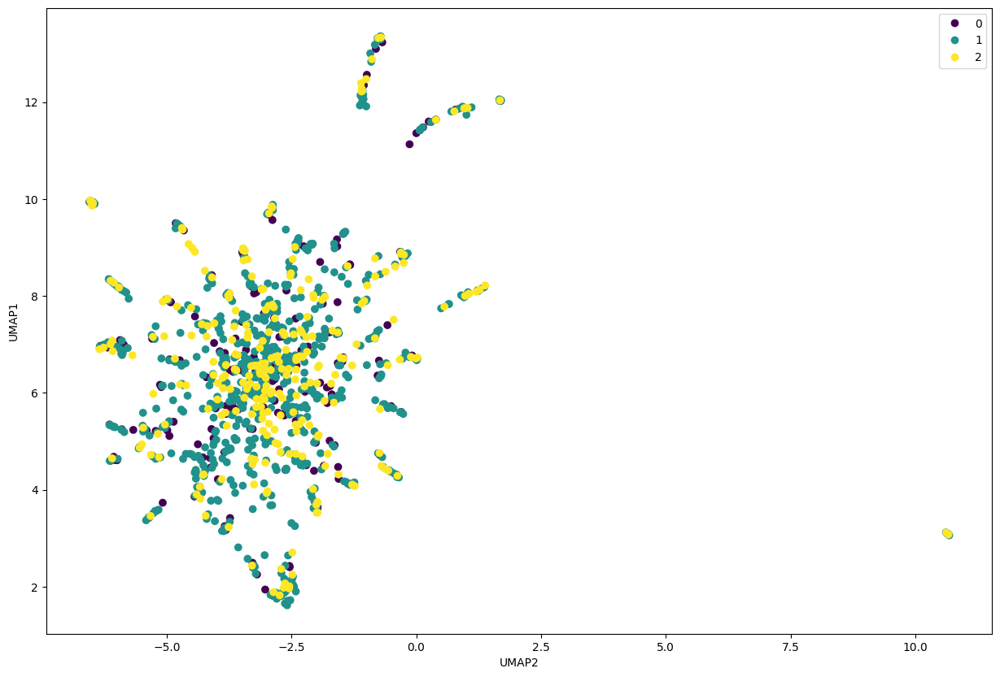

In [114]:
X3_norm3_umap = umap_create_visualize(X3_norm3)

(1165, 2)


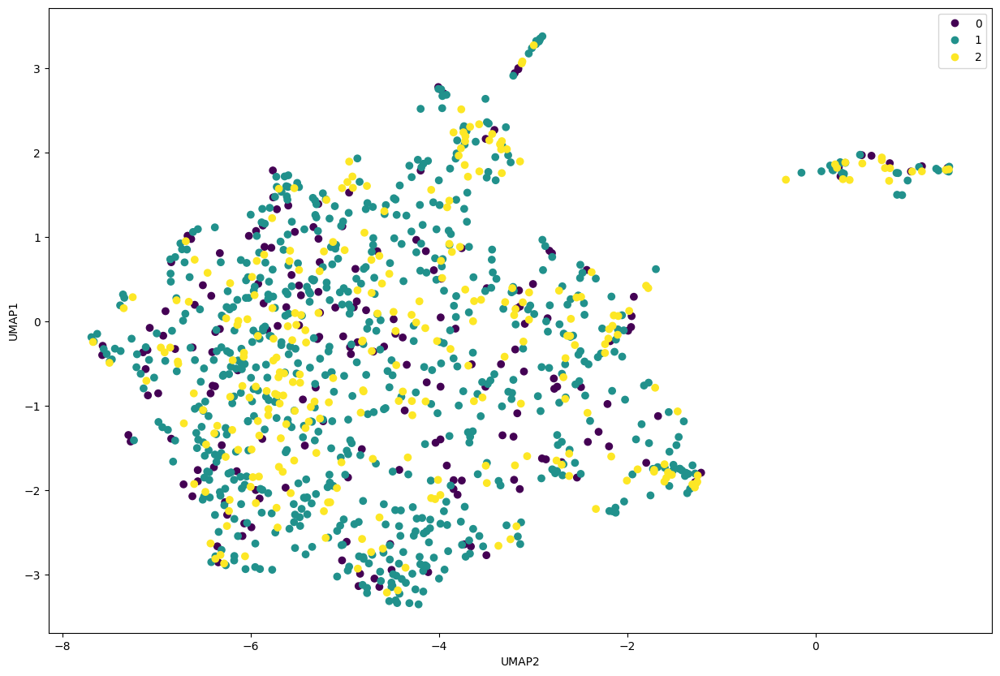

In [115]:
X3_norm4_umap = umap_create_visualize(X3_norm4)

(1165, 2)


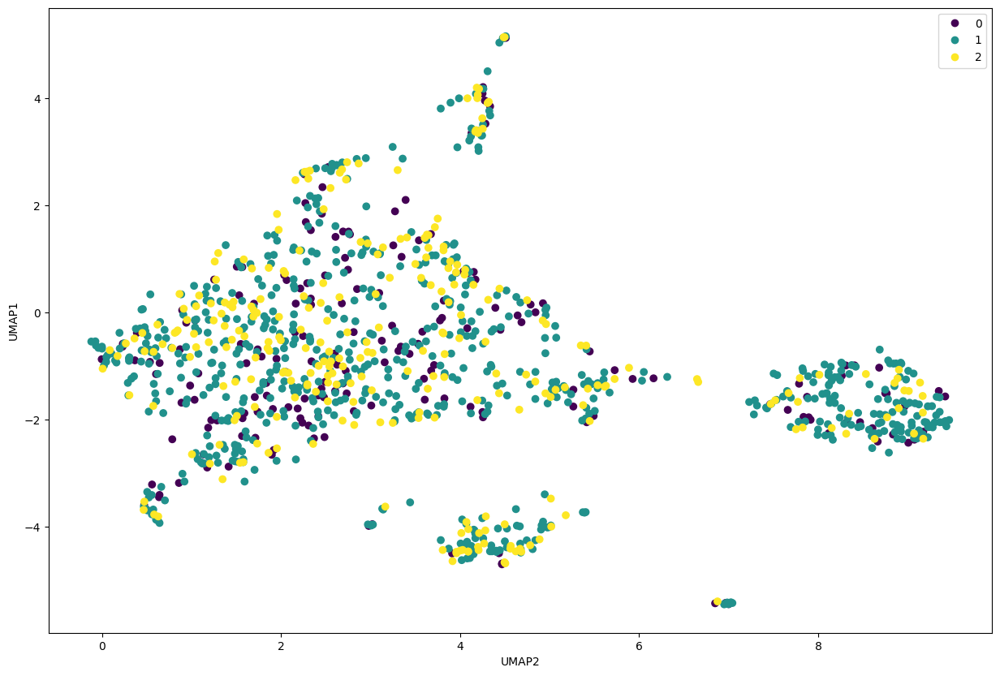

In [116]:
X3_norm5_umap = umap_create_visualize(X3_norm5)

## 1.X.2 Let's do PCA now 

After feature selection with PCA, from 60483 features we left 3 features


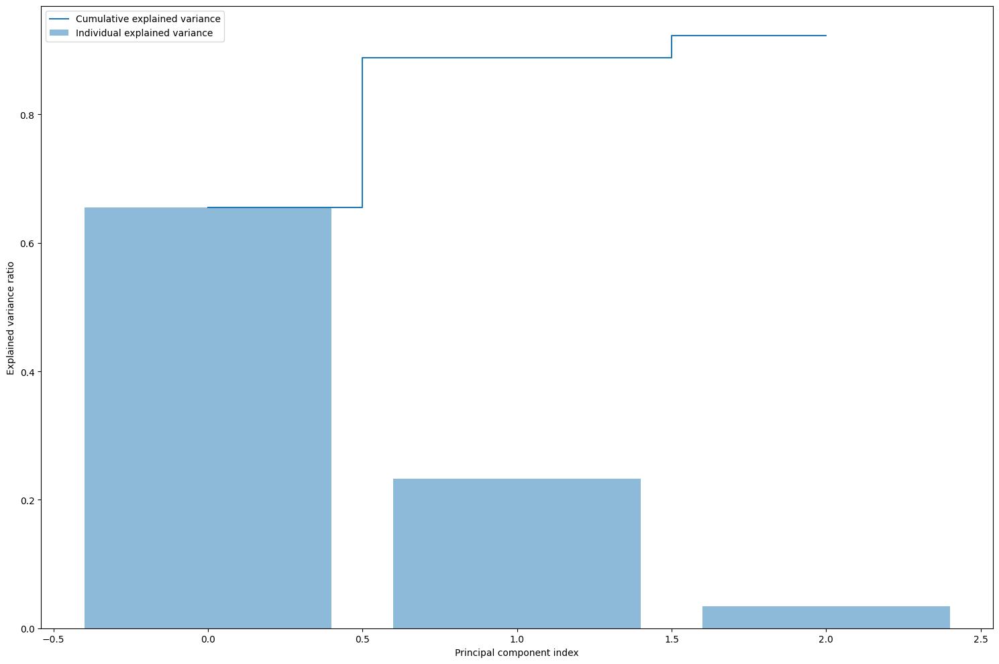

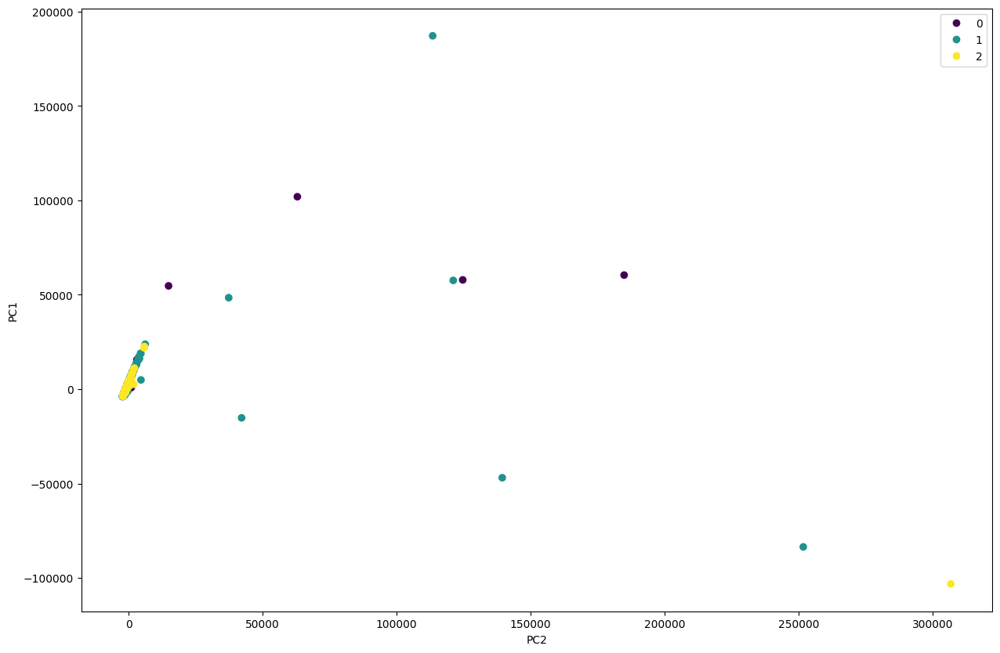

In [117]:
X3_norm0_pca = pca_create_visualize(X3_norm0)

After feature selection with PCA, from 60483 features we left 537 features


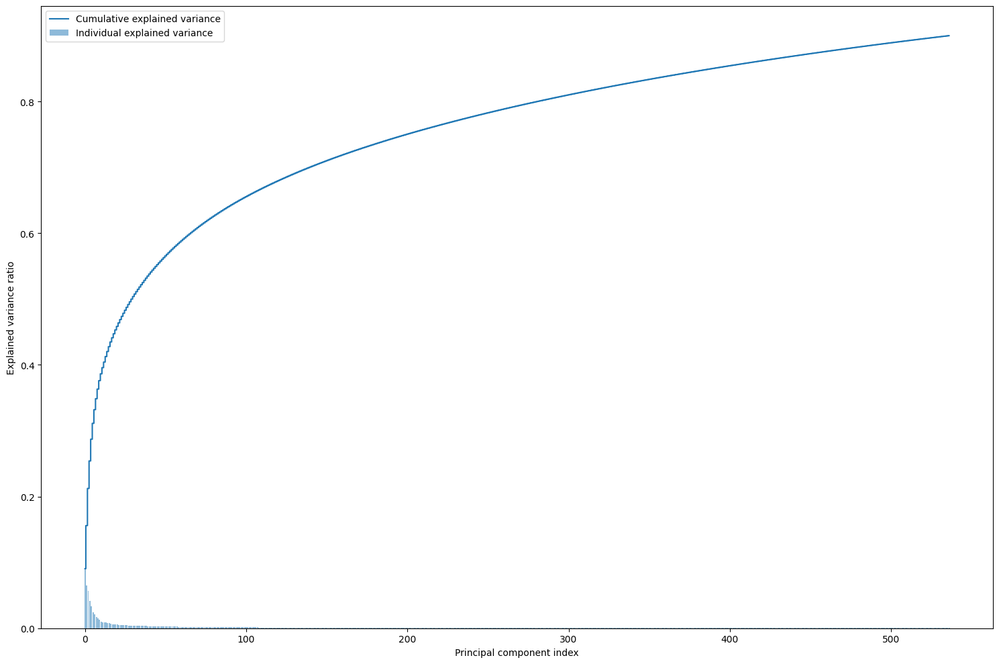

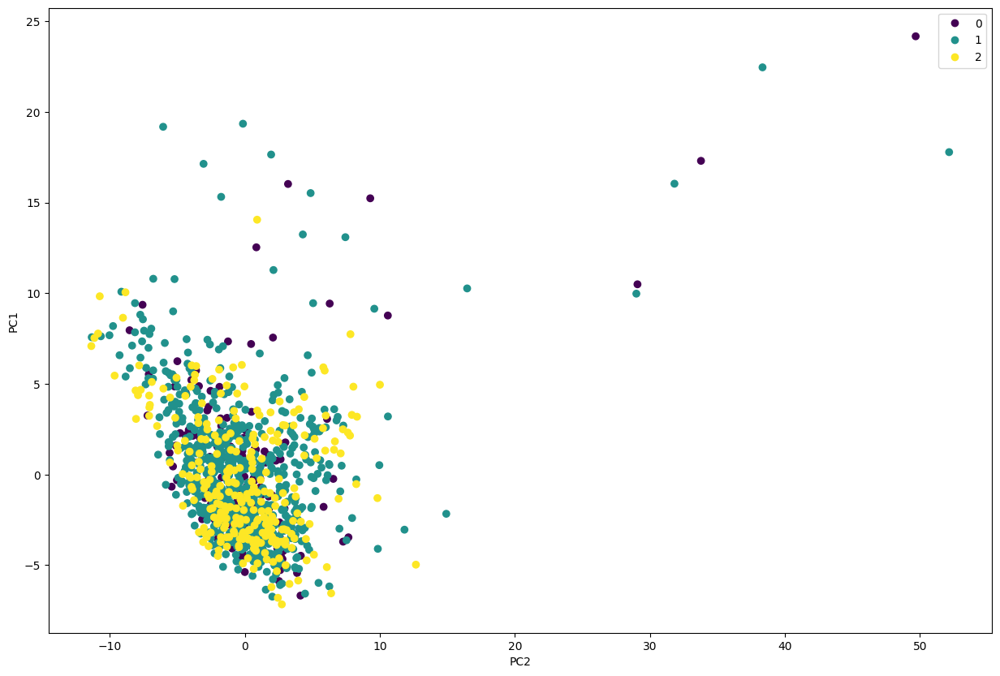

In [118]:
X3_norm1_pca = pca_create_visualize(X3_norm1)

After feature selection with PCA, from 60483 features we left 544 features


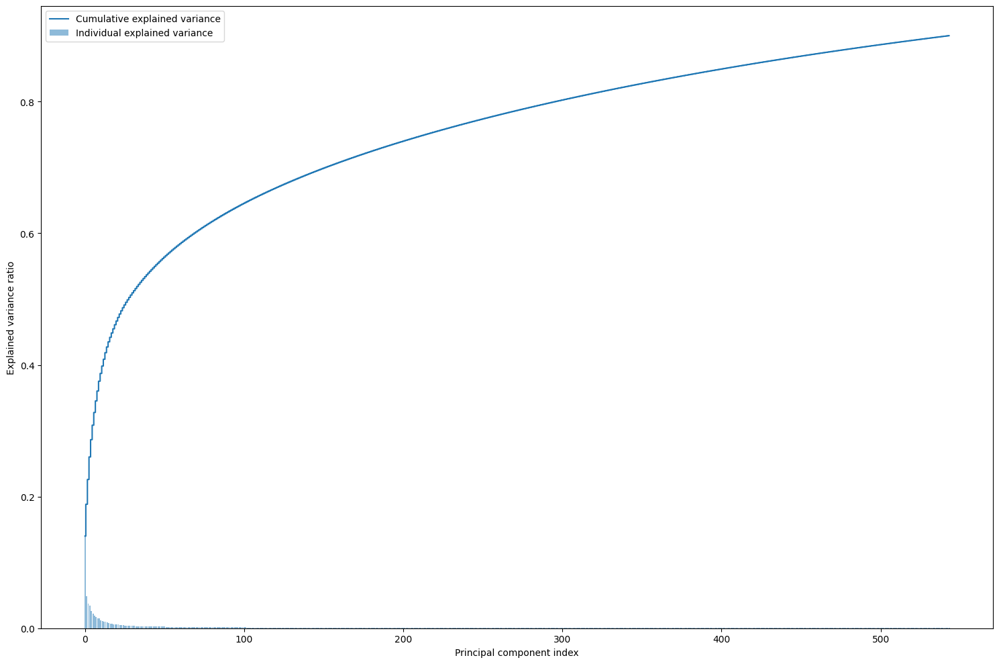

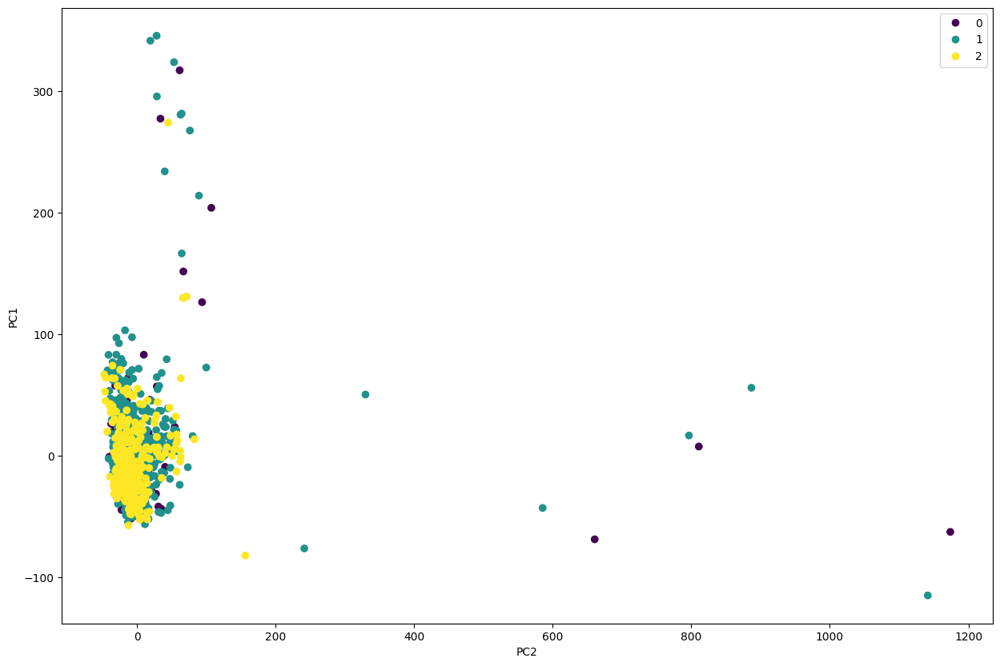

In [119]:
X3_norm2_pca = pca_create_visualize(X3_norm2)

After feature selection with PCA, from 60483 features we left 2 features


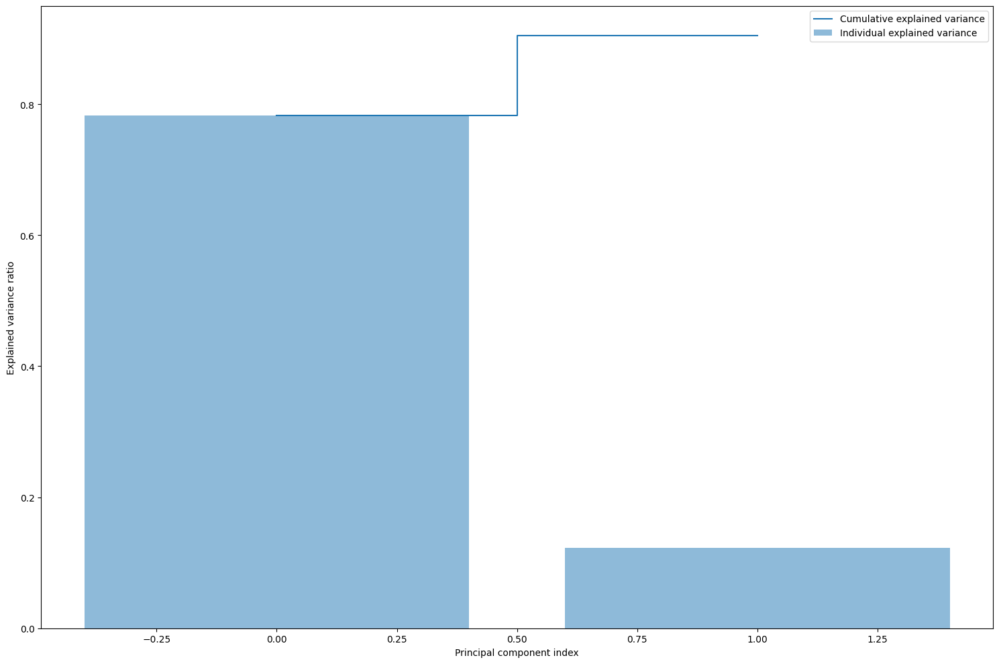

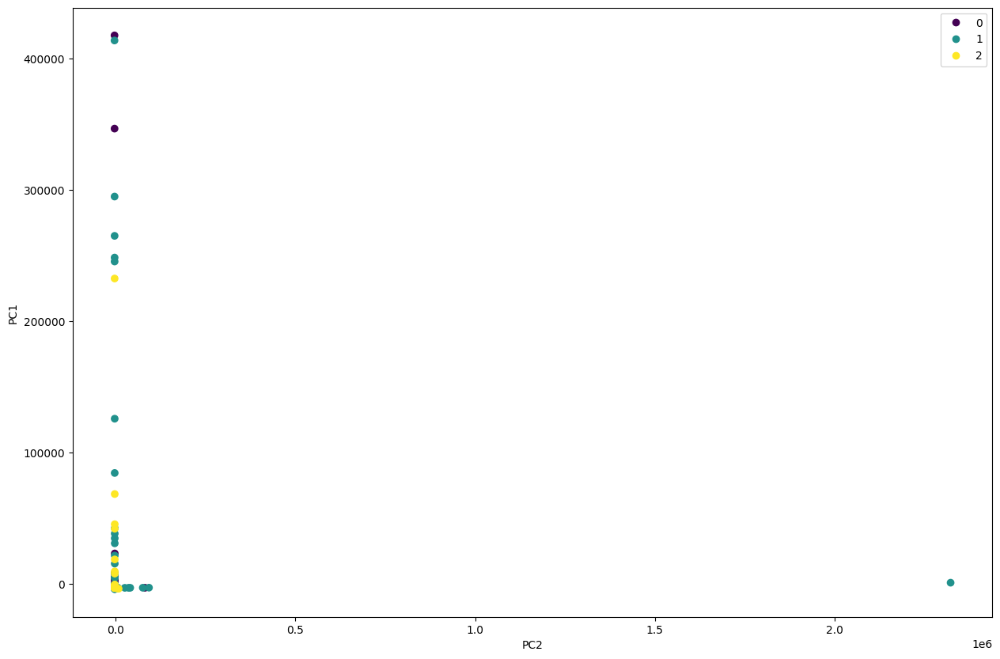

In [120]:
X3_norm3_pca = pca_create_visualize(X3_norm3)

After feature selection with PCA, from 60483 features we left 544 features


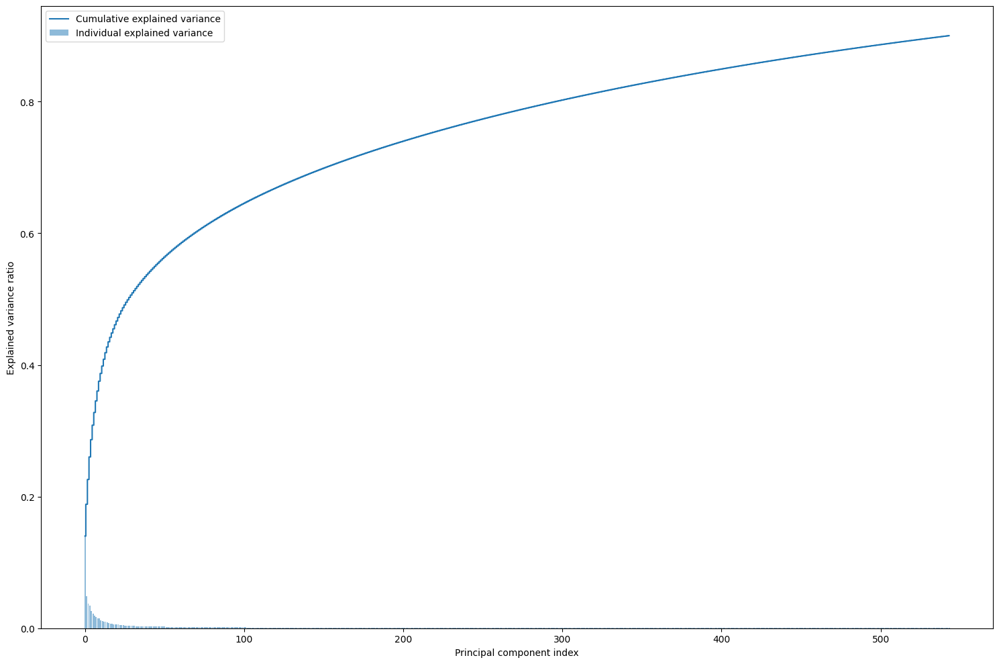

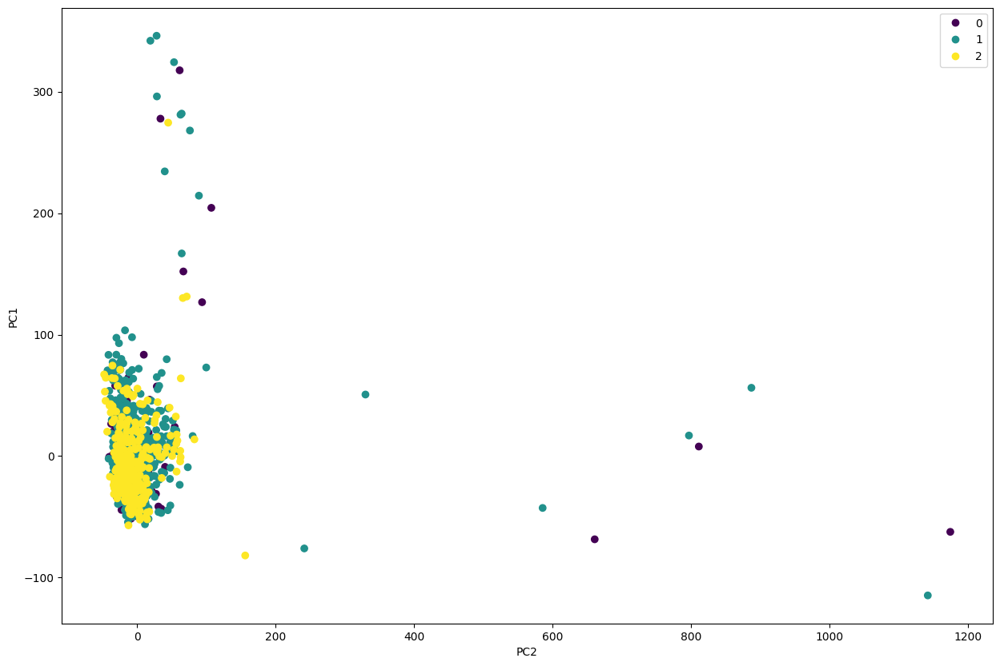

In [121]:
X3_norm4_pca = pca_create_visualize(X3_norm4)

After feature selection with PCA, from 60483 features we left 464 features


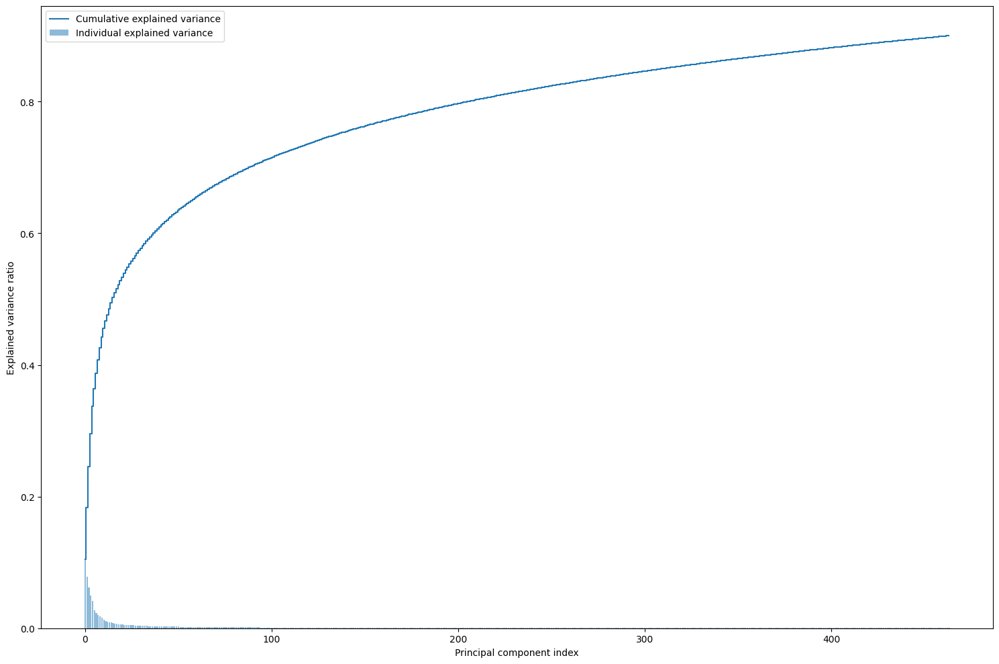

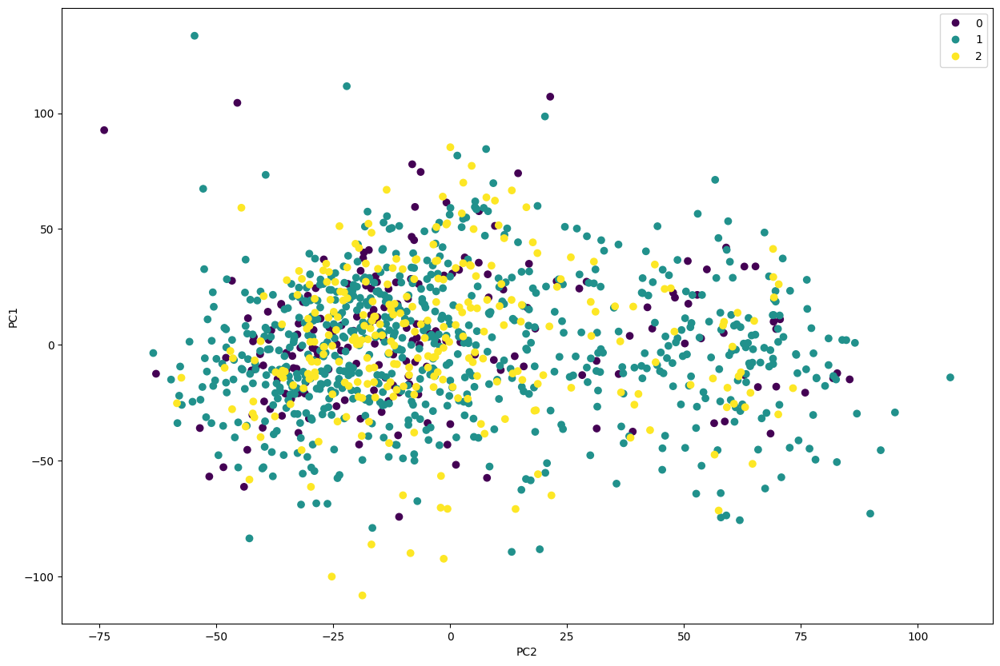

In [122]:
X3_norm5_pca = pca_create_visualize(X3_norm5)

## 4- Feature selection -  L1-based feature selection¶ ################### ---------------a

In [67]:
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel


lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(X_initial, y_initial)
model = SelectFromModel(lsvc, prefit=True)
X = model.transform(X_initial)

X = pd.DataFrame(X)


/home/bnt4me/Virginia/venv/jup_notebook/lib/python3.8/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/bnt4me/Virginia/venv/jup_notebook/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


## 4.0 - No normalization

In [68]:
%%time

X4_norm0 = X


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.05 µs


## 4.1 Normalization1  - min max normalization

In [123]:
%%time

X4_norm1 = (X - X.min()) /(X.max() - X.min())


CPU times: user 375 ms, sys: 39.5 ms, total: 415 ms
Wall time: 411 ms


## 4.2 Normalization2 - ?  Standard ??

In [124]:
X4_norm2 = X.apply(lambda iterator: ((iterator - iterator.mean())/iterator.std()).round(2))

## 4.3 Normalization3 - RobustScaler

In [125]:
from sklearn.preprocessing import RobustScaler

X4_norm3 = RobustScaler().fit_transform(X)

## 4.4 Normalization4 - StandardScaler

In [126]:
from sklearn.preprocessing import StandardScaler


X4_norm4 = StandardScaler().fit_transform(X)

## 4.5 Normalization5 - log2Transform

In [127]:
import numpy as np


X4_norm5 = X.transform(lambda x: np.log2(x + 1))

### Now lest visualize normalization

In [135]:
X4_norm1

,0,1,2,3,4,5,6,7,8,9,...,1093,1094,1095,1096,1097,1098,1099,1100,1101,1102
0,0.027927,0.002114,0.152627,0.044176,0.141037,0.133423,0.589829,0.138453,0.057296,0.256877,...,0.000000,0.000000,0.000047,0.005587,0.010888,0.000271,0.009791,0.000016,0.177201,0.000000
1,0.021420,0.001000,0.277875,0.071043,0.131230,0.111333,0.242318,0.353964,0.022838,0.131248,...,0.000000,0.000000,0.000000,0.007585,0.026113,0.000284,0.001709,0.000000,0.137198,0.000000
2,0.050041,0.001467,0.086439,0.096447,0.189540,0.119515,0.008725,0.037065,0.027926,1.000000,...,0.000450,0.000000,0.000046,0.013507,0.008022,0.001971,0.045564,0.000016,0.312477,0.000607
3,0.026543,0.004567,0.172883,0.063381,0.140447,0.175449,0.546002,0.120680,0.076143,0.317660,...,0.010377,0.005669,0.000231,0.007820,0.034739,0.001531,0.001370,0.000079,0.067572,0.002344
4,0.062914,0.019080,0.228465,0.211670,0.101181,0.279670,0.017360,0.058482,0.164011,0.093224,...,0.000515,0.006371,0.000476,0.005138,0.058403,0.001249,0.282818,0.000010,0.066772,0.000318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1160,0.036445,0.000452,0.260711,0.089811,0.126115,0.241379,0.030350,0.204108,0.045956,0.188667,...,0.000178,0.000000,0.000064,0.019261,0.059742,0.000122,0.000614,0.000055,0.058131,0.000102
1161,0.074217,0.003260,0.237346,0.440879,0.198126,0.416907,0.018227,0.103951,0.077205,0.556910,...,0.000261,0.088792,0.000377,0.011524,0.041236,0.000278,0.006331,0.000023,0.316429,0.000068
1162,0.049582,0.034808,0.117427,0.263094,0.134715,0.167335,0.015722,0.091994,0.204299,0.274100,...,0.002236,0.001773,0.000083,0.005269,0.025686,0.017520,0.006419,0.000019,0.148254,0.019971
1163,0.031841,0.007161,0.171938,0.037091,0.138964,0.254678,0.017822,0.259922,0.000000,0.037011,...,0.000088,0.000000,0.001475,0.006901,0.117450,0.000583,0.004569,0.000093,0.056875,0.000050


In [137]:
X4_norm2

,0,1,2,3,4,5,6,7,8,9,...,1093,1094,1095,1096,1097,1098,1099,1100,1101,1102
0,-0.48,-0.60,-0.28,-1.11,0.03,-0.68,7.36,-0.00,-0.38,0.14,...,-0.22,-0.39,-0.13,-0.16,-0.58,-0.31,-0.44,-0.05,0.44,-0.30
1,-0.56,-0.61,0.88,-0.88,-0.10,-0.88,2.68,1.76,-0.69,-1.02,...,-0.22,-0.39,-0.13,-0.13,-0.32,-0.31,-0.52,-0.05,0.06,-0.30
2,-0.19,-0.61,-0.89,-0.65,0.67,-0.81,-0.47,-0.83,-0.65,7.03,...,-0.21,-0.39,-0.13,-0.03,-0.63,-0.28,-0.05,-0.05,1.75,-0.29
3,-0.49,-0.58,-0.09,-0.94,0.02,-0.31,6.77,-0.15,-0.21,0.70,...,0.02,-0.33,-0.13,-0.13,-0.17,-0.29,-0.53,-0.05,-0.62,-0.26
4,-0.03,-0.44,0.42,0.37,-0.49,0.62,-0.36,-0.66,0.58,-1.38,...,-0.21,-0.32,-0.12,-0.17,0.24,-0.29,2.49,-0.05,-0.62,-0.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1160,-0.37,-0.62,0.72,-0.71,-0.16,0.28,-0.18,0.53,-0.48,-0.49,...,-0.22,-0.39,-0.13,0.06,0.26,-0.31,-0.53,-0.05,-0.71,-0.30
1161,0.12,-0.59,0.51,2.41,0.78,1.84,-0.35,-0.29,-0.20,2.92,...,-0.22,0.62,-0.12,-0.06,-0.06,-0.31,-0.47,-0.05,1.79,-0.30
1162,-0.20,-0.29,-0.60,0.83,-0.05,-0.38,-0.38,-0.38,0.95,0.30,...,-0.17,-0.37,-0.13,-0.17,-0.32,-0.01,-0.47,-0.05,0.16,0.07
1163,-0.43,-0.55,-0.10,-1.18,0.00,0.40,-0.35,0.99,-0.90,-1.90,...,-0.22,-0.39,-0.10,-0.14,1.26,-0.30,-0.49,-0.05,-0.72,-0.30


In [138]:
X4_norm3

array([[-0.50716133, -0.3098976 , -0.07499091, ..., -0.36514391,
         0.76484637, -0.26911992],
       [-0.67025138, -0.32457095,  1.28891442, ..., -0.58630301,
         0.32028439, -0.26911992],
       [ 0.04712895, -0.31842026, -0.79575536, ..., -0.36909586,
         2.26818081, -0.20478836],
       ...,
       [ 0.03562863,  0.12061216, -0.4583103 , ..., -0.32808746,
         0.44314818,  1.84906875],
       [-0.4090495 , -0.24344897,  0.13529827, ...,  0.69612283,
        -0.57234978, -0.2638077 ],
       [ 1.45382069, -0.1506232 ,  1.96090461, ...,  0.43028432,
         1.32411795, -0.25584879]])

In [139]:
X4_norm4

array([[-0.47584033, -0.60255558, -0.27830748, ..., -0.05373323,
         0.44405308, -0.30479978],
       [-0.55934734, -0.61308238,  0.881412  , ..., -0.05421301,
         0.05726084, -0.30479978],
       [-0.19202701, -0.60866982, -0.89116861, ..., -0.0537418 ,
         1.7520329 , -0.29340392],
       ...,
       [-0.19791552, -0.29370409, -0.60424136, ..., -0.05365284,
         0.16415879,  0.07042149],
       [-0.42560411, -0.55488476, -0.09950001, ..., -0.0514309 ,
        -0.7193777 , -0.30385876],
       [ 0.52824151, -0.48829073,  1.45280071, ..., -0.05200761,
         0.93064869, -0.3024489 ]])

## 4.X.0 We are not doing dimentionality reduction

We will have: X_norm1, X_norm2, X_norm3, X_norm4

## 4.X.1 Let's do Umap now 

(1165, 2)


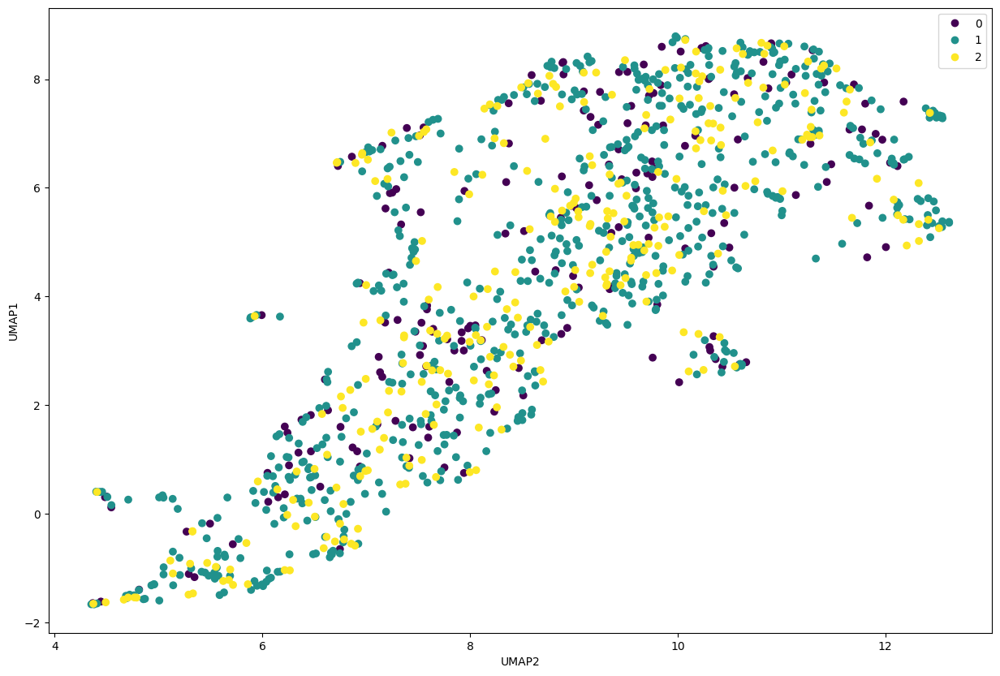

In [128]:
X4_norm0_umap = umap_create_visualize(X4_norm0)

(1165, 2)


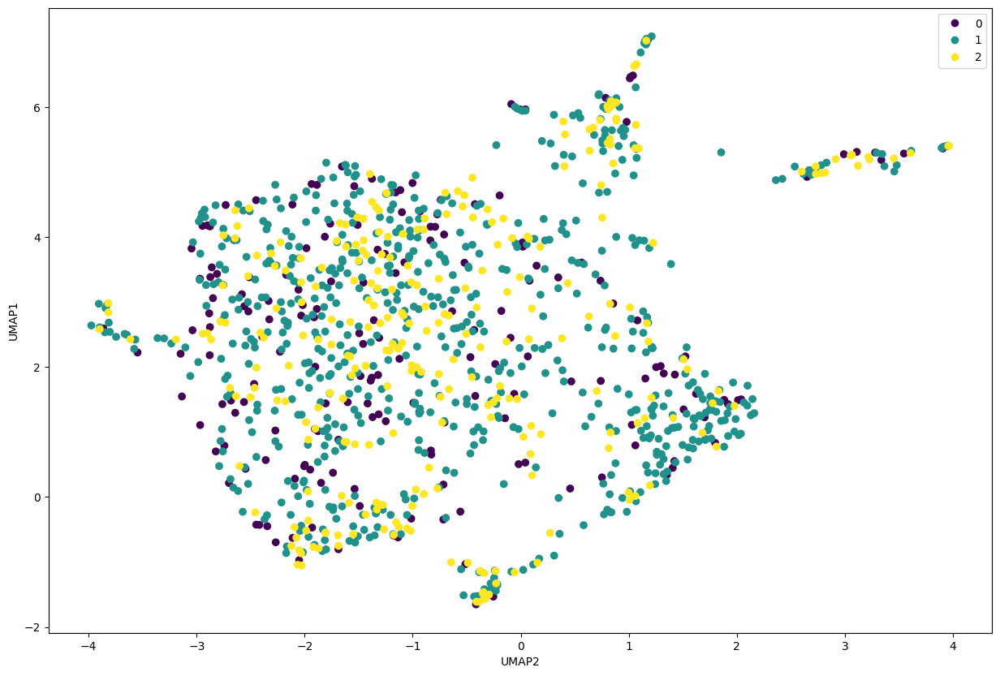

In [129]:
X4_norm1_umap = umap_create_visualize(X4_norm1)

(1165, 2)


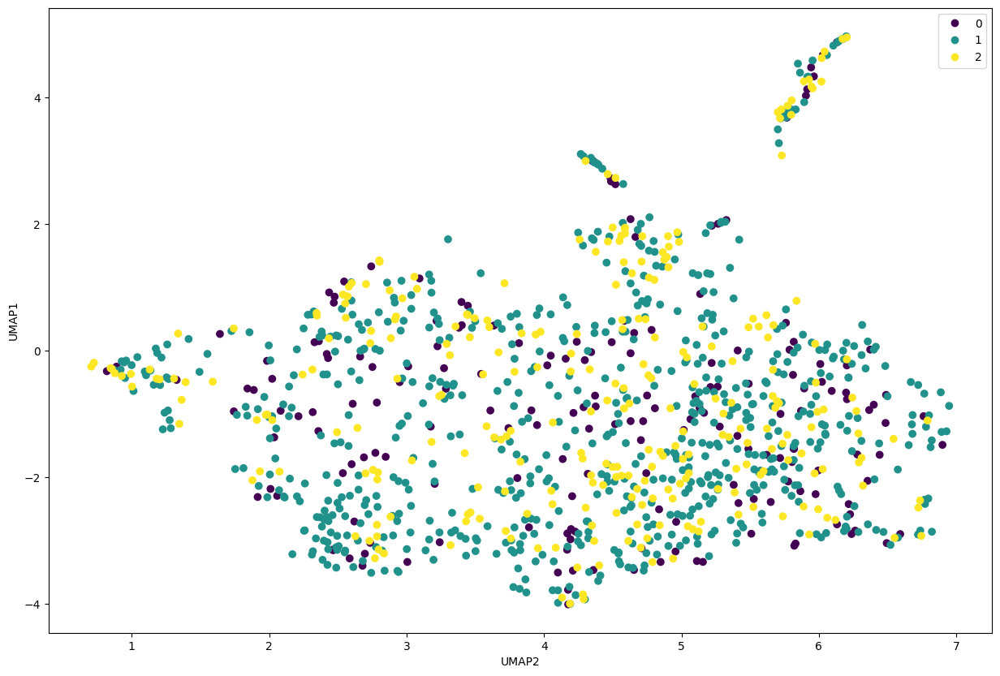

In [130]:
X4_norm2_umap = umap_create_visualize(X4_norm2)

(1165, 2)


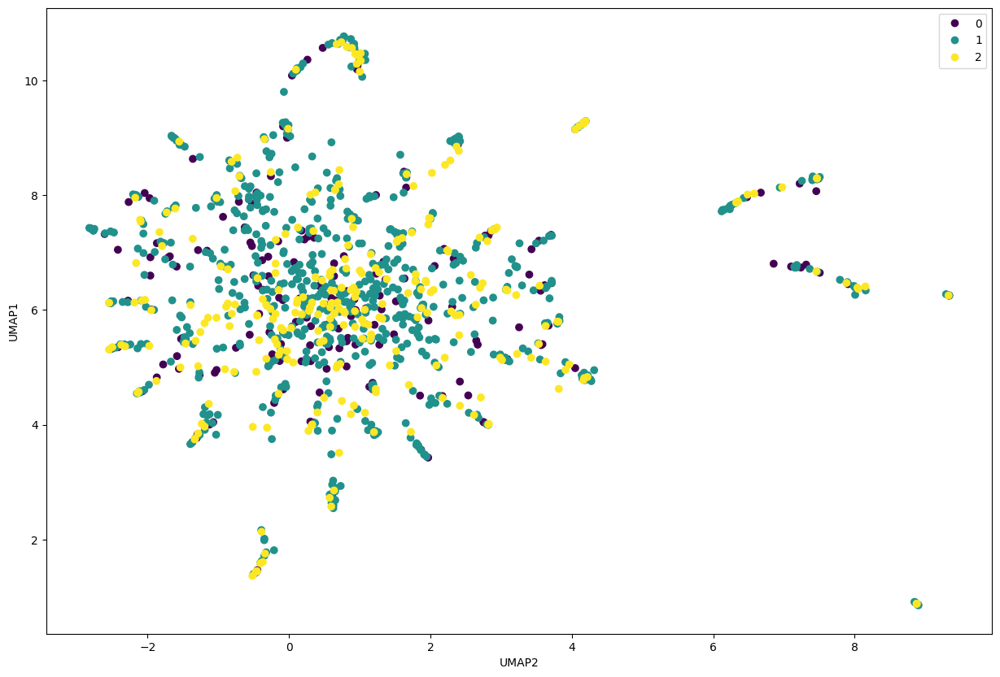

In [131]:
X4_norm3_umap = umap_create_visualize(X4_norm3)

(1165, 2)


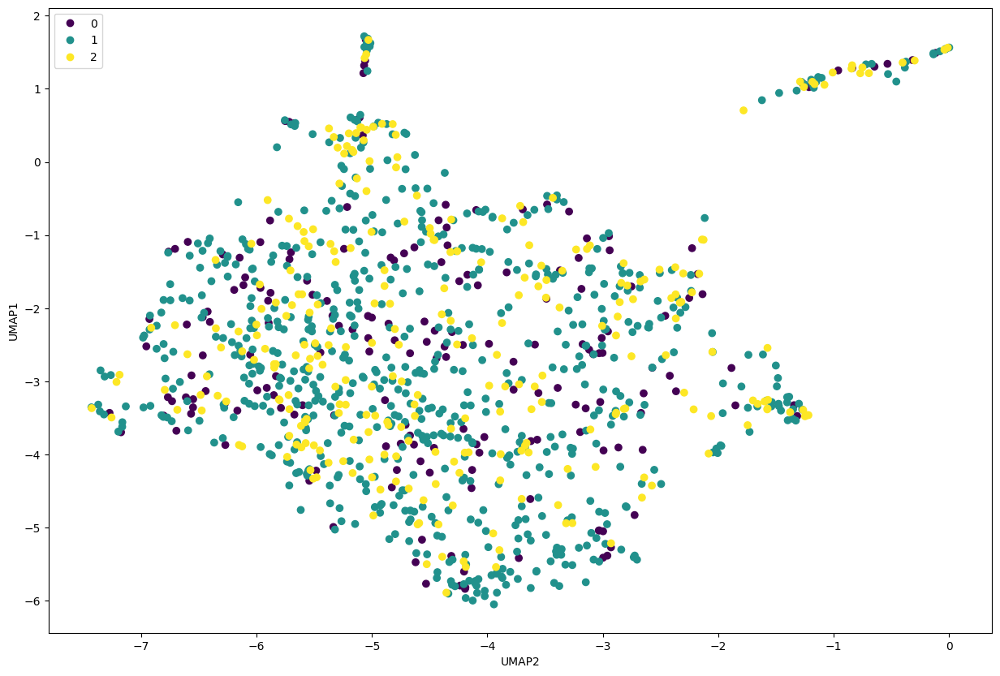

In [132]:
X4_norm4_umap = umap_create_visualize(X4_norm4)

(1165, 2)


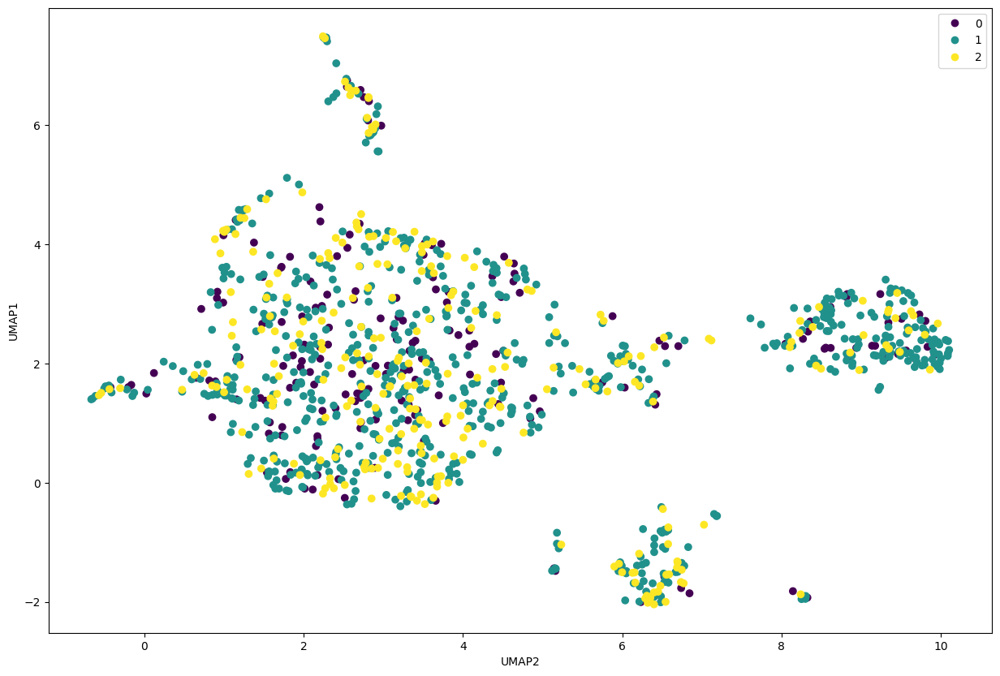

In [133]:
X4_norm5_umap = umap_create_visualize(X4_norm5)

## 4.X.2 Let's do PCA now 

After feature selection with PCA, from 60483 features we left 10 features


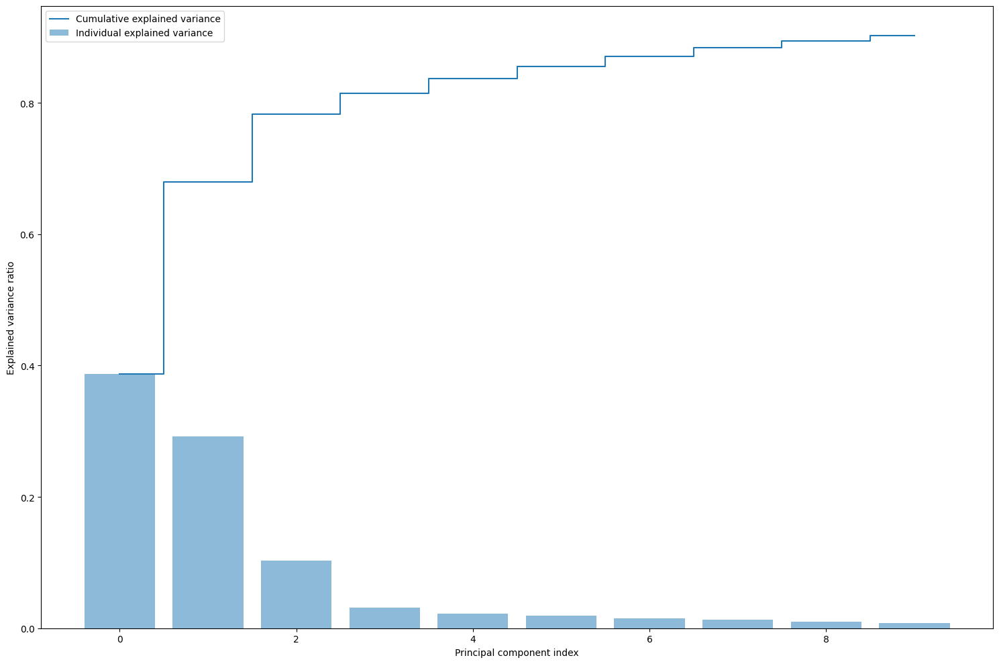

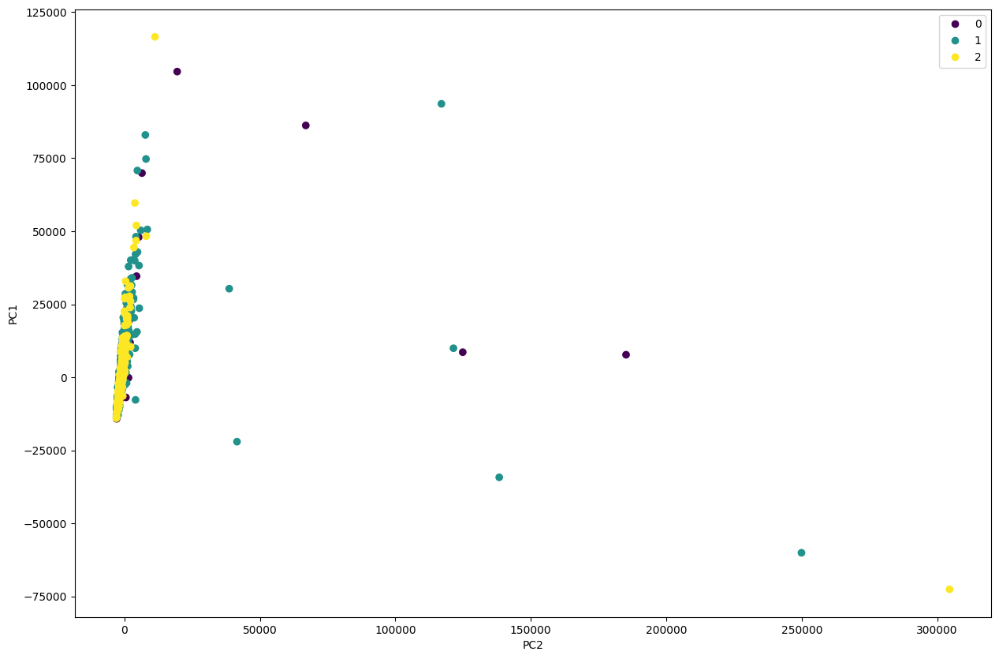

In [134]:
X4_norm0_pca = pca_create_visualize(X4_norm0)

After feature selection with PCA, from 60483 features we left 537 features


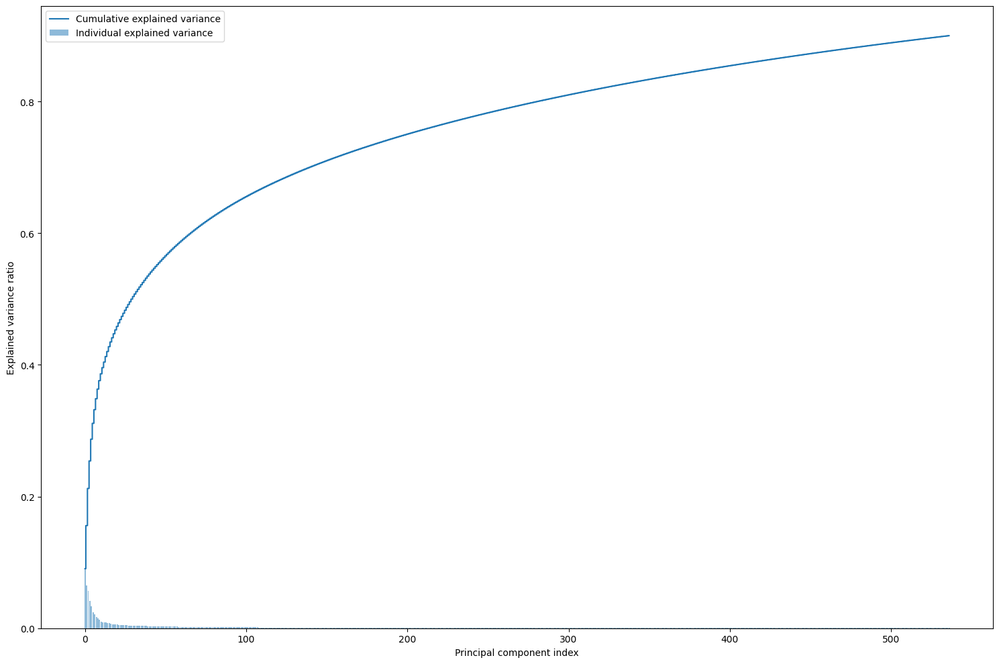

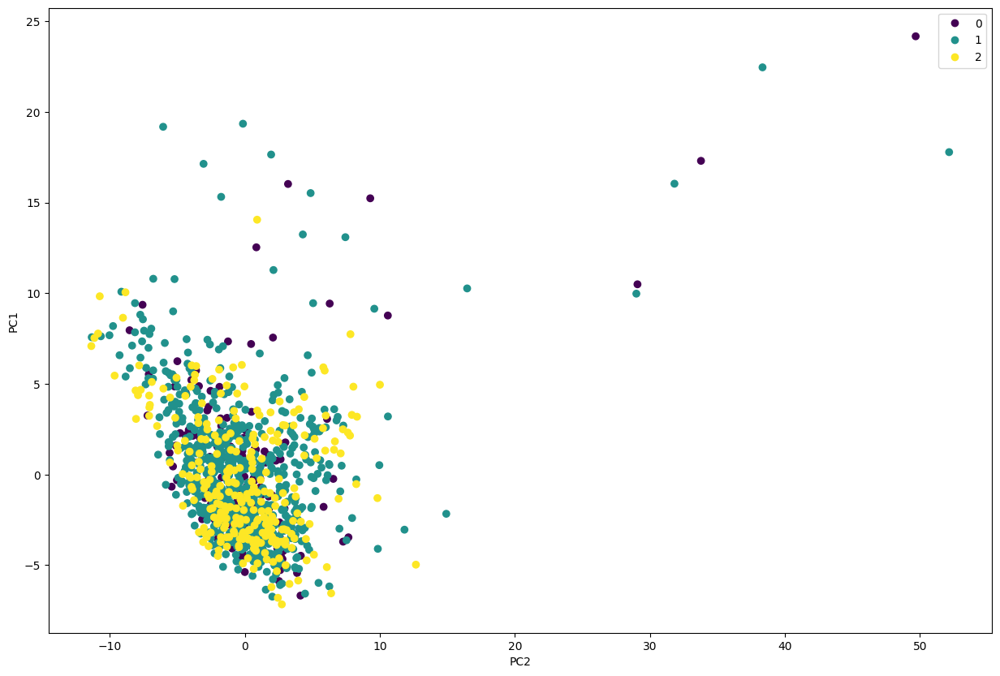

In [135]:
X4_norm1_pca = pca_create_visualize(X4_norm1)

After feature selection with PCA, from 60483 features we left 544 features


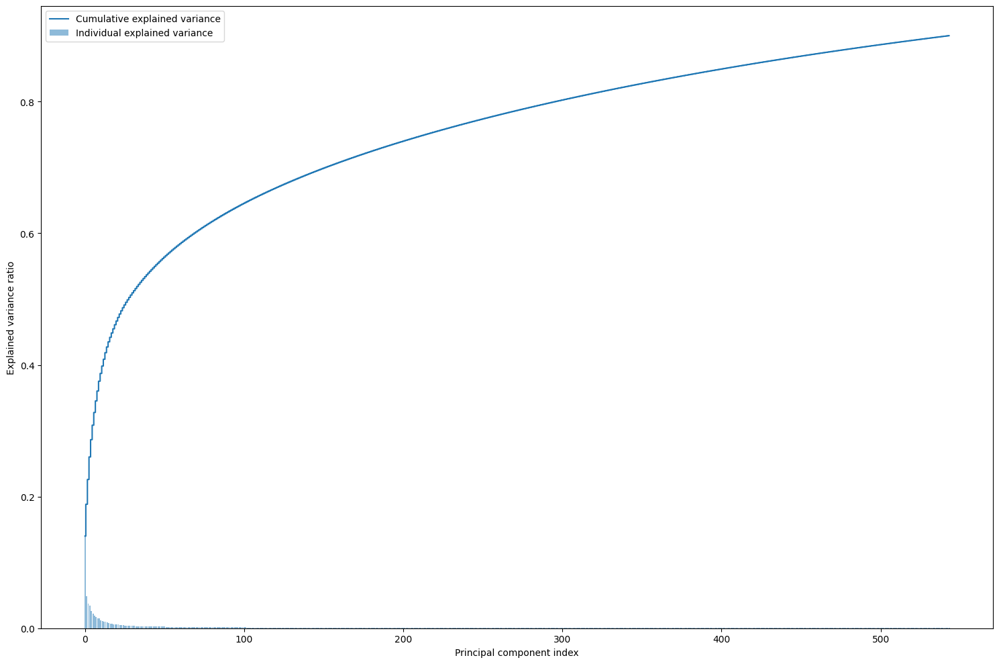

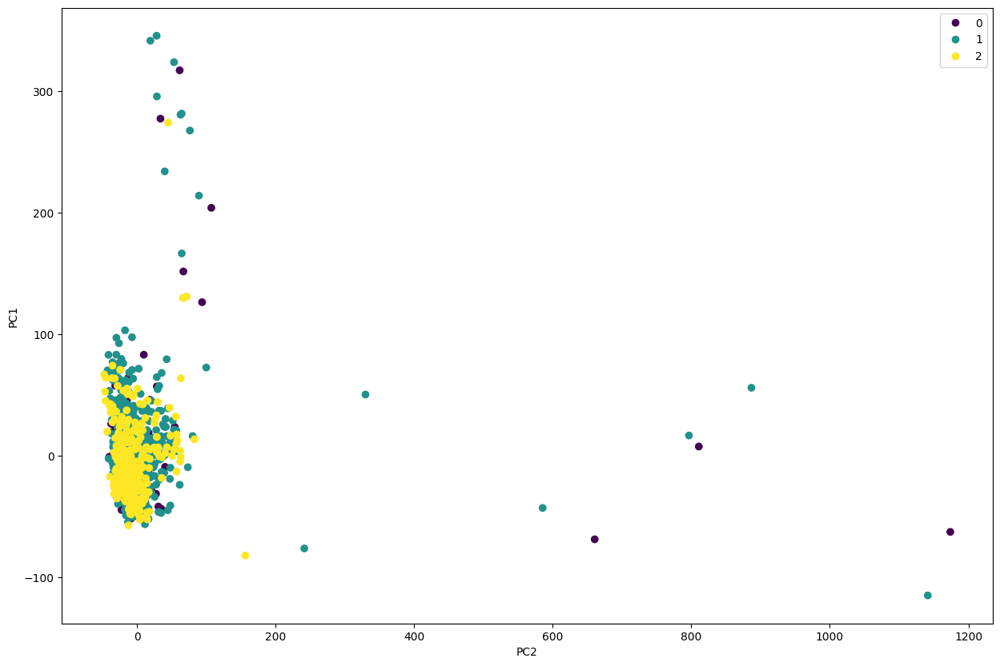

In [136]:
X4_norm2_pca = pca_create_visualize(X4_norm2)

After feature selection with PCA, from 60483 features we left 2 features


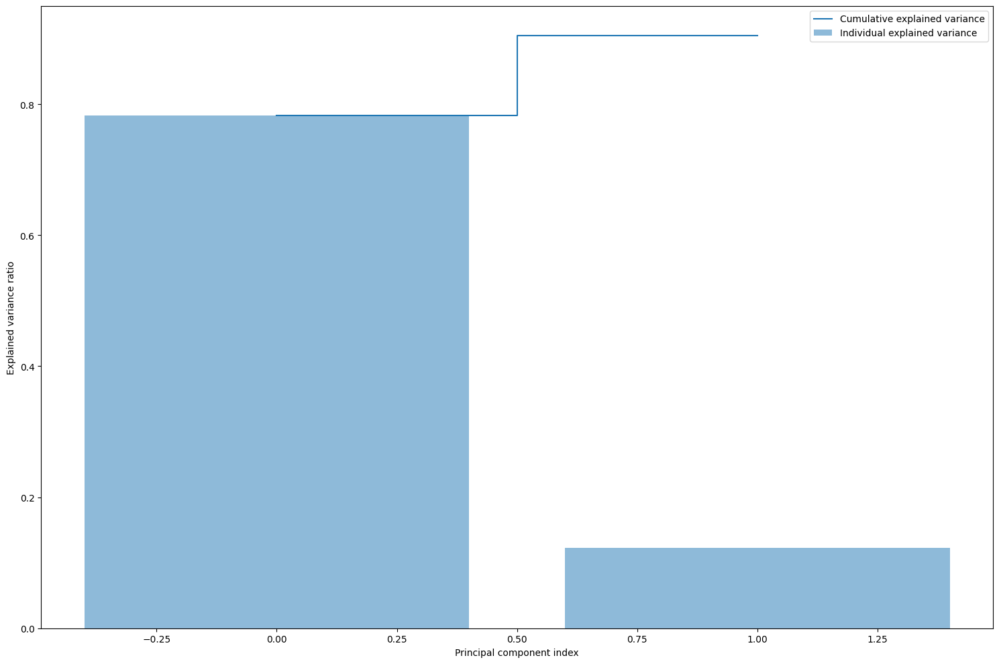

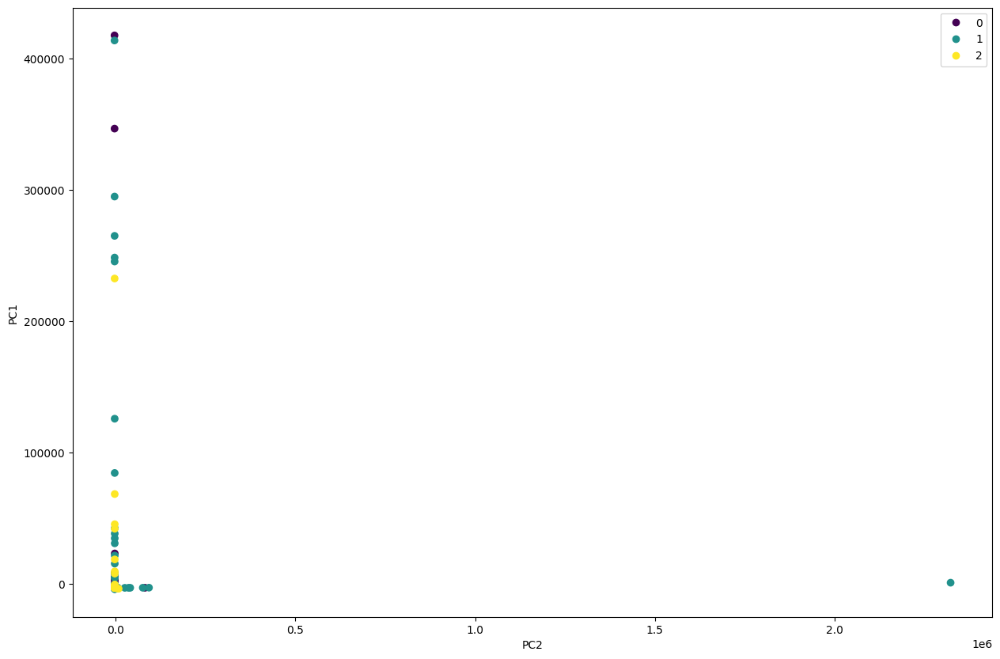

In [137]:
X3_norm3_pca = pca_create_visualize(X3_norm3)

After feature selection with PCA, from 60483 features we left 544 features


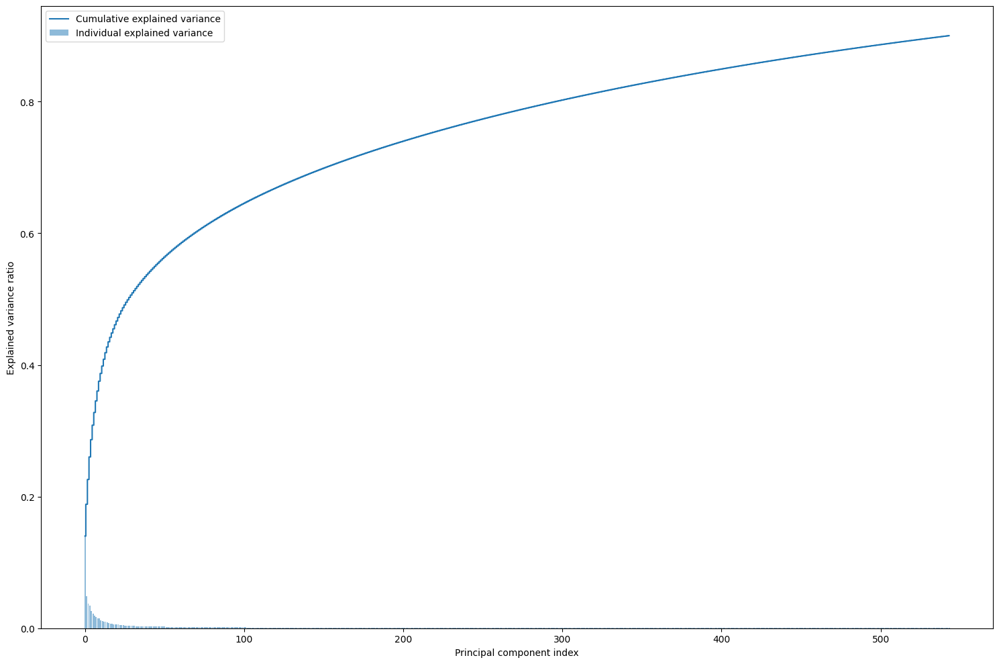

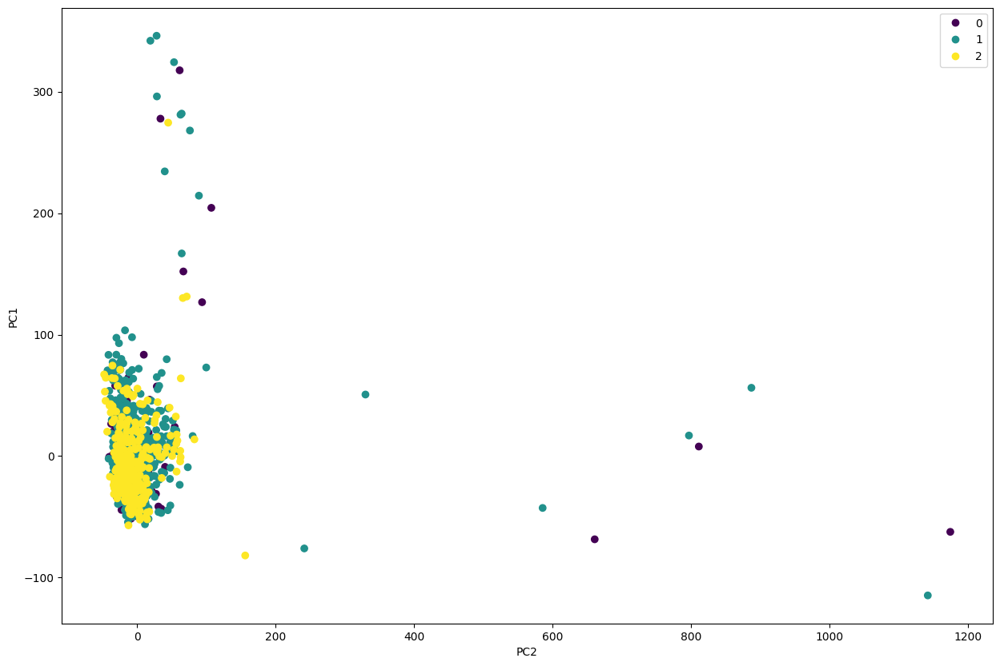

In [138]:
X4_norm4_pca = pca_create_visualize(X4_norm4)

After feature selection with PCA, from 60483 features we left 464 features


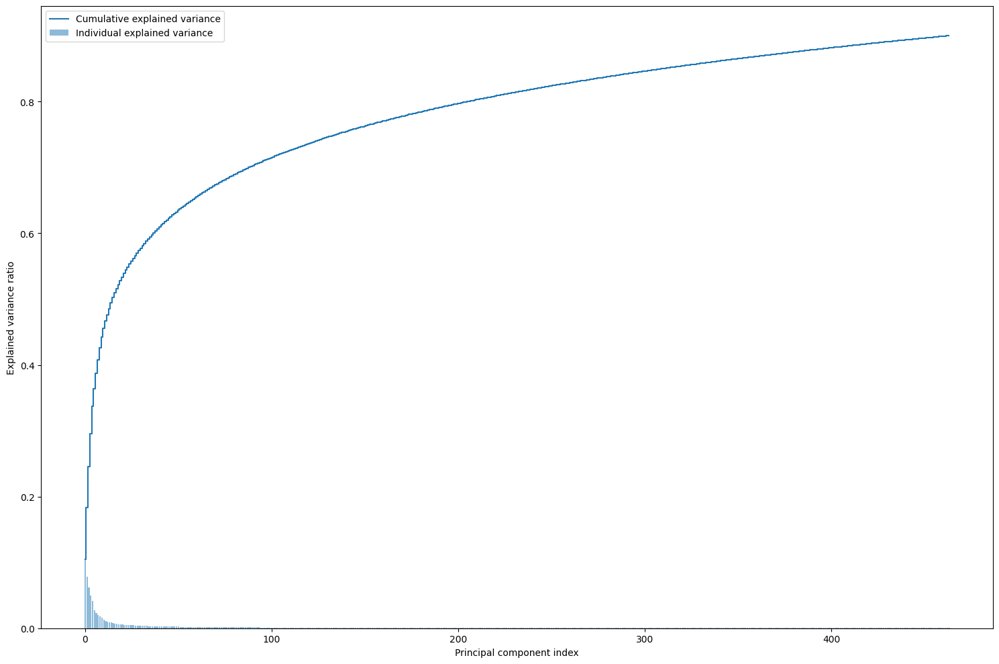

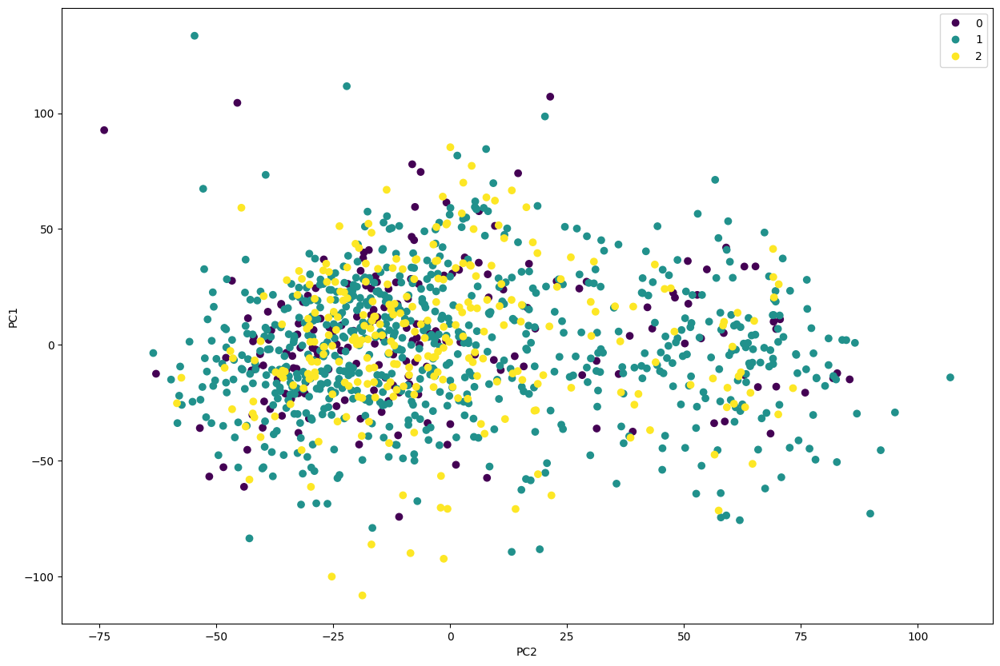

In [139]:
X4_norm5_pca = pca_create_visualize(X4_norm5)

END

# Data Plots

In [157]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

### Histogram - numbers

In [145]:
y

9c2ffccc-c4c8-4f87-bcd8-8ce099e31b1b.tsv    0
98bb8ea9-025e-40cd-a21e-3a9dd478ef23.tsv    0
80072d64-b734-46ef-b4bf-a9e5cd0d5d06.tsv    0
d14add36-6662-47ce-9a26-3374bf1e8807.tsv    0
728be0eb-7a5b-42cd-84d9-6a86cec842d5.tsv    0
                                           ..
e3cacc94-c92a-42b1-9fad-9db163983729.tsv    2
c7843936-3b14-48b4-8642-8554341d3f21.tsv    2
f6d3d770-157b-479b-a5cc-56e174dda026.tsv    2
837edc9c-0d20-4889-a9cd-a54ed6b68d13.tsv    2
3bdf6376-9aa9-44cc-a1f1-5a6387edce23.tsv    2
Name: tumor_stage, Length: 1165, dtype: int64

In [146]:
from collections import Counter

In [151]:
values_count = data.tumor_stage.value_counts()

In [154]:
dict_count = dict(values_count)

In [156]:
dict_count

{'stage_2': 694, 'stage_3': 283, 'stage_1': 188, 'stage_4': 20}

In [158]:
stage_key = ["Stage 1","Stage 2","Stage 3","Stage 4"]
stage_value = [dict_count['stage_1'],dict_count['stage_2'],dict_count['stage_3'],dict_count['stage_4']]

Text(0.5, 1.0, 'Barplot of numver of samples per stage')

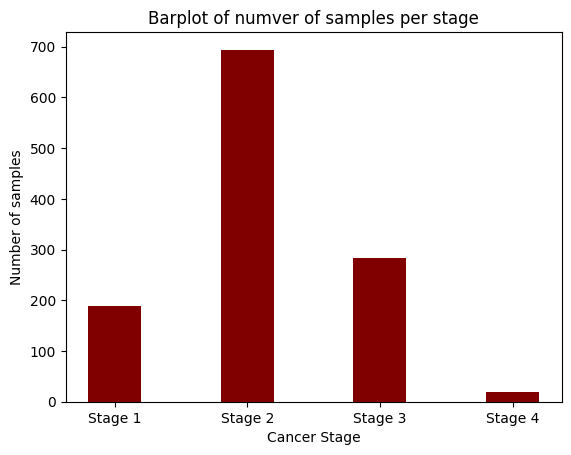

In [168]:
plt.bar(stage_key, stage_value, color ='maroon',
        width = 0.4)
plt.xlabel("Cancer Stage")
plt.ylabel("Number of samples")
plt.title("Barplot of numver of samples per stage")

### BoxPlot

In [169]:
data_st1 = data[data.tumor_stage == "stage_4"]
data_st2 = data[data.tumor_stage == "stage_2"]
data_st3 = data[data.tumor_stage == "stage_3"]
data_st4 = data[data.tumor_stage == "stage_4"]

In [170]:
data_st1_1  = data_st1.drop(['tumor_stage'], axis=1)
data_st1_2  = data_st2.drop(['tumor_stage'], axis=1)
data_st1_3  = data_st3.drop(['tumor_stage'], axis=1)
data_st1_4  = data_st4.drop(['tumor_stage'], axis=1)

In [175]:
data_st1_1.mean()

ENSG00000000003.13     7.854418
ENSG00000000005.5      0.441524
ENSG00000000419.11    35.626042
ENSG00000000457.12     4.415612
ENSG00000000460.15     2.234651
                        ...    
ENSGR0000275287.3      0.000000
ENSGR0000276543.3      0.000000
ENSGR0000277120.3      0.000000
ENSGR0000280767.1      0.000000
ENSGR0000281849.1      0.000000
Length: 60483, dtype: float64

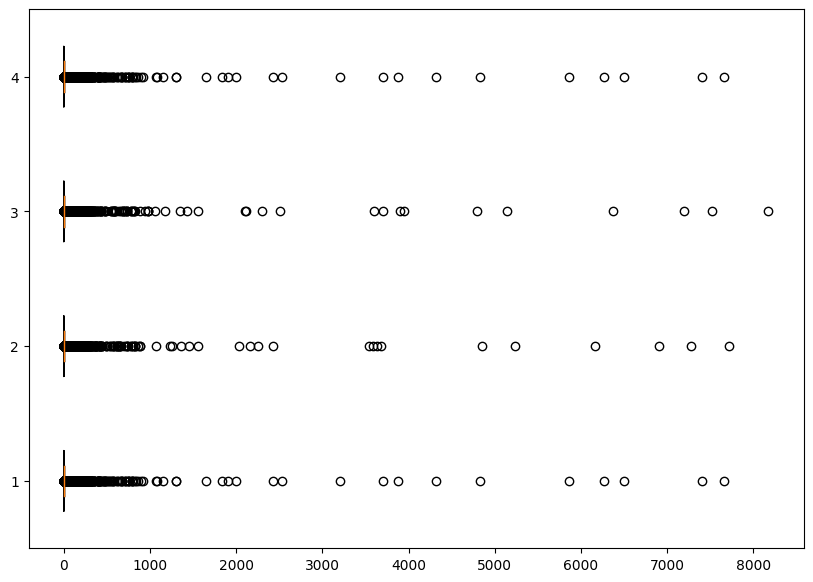

In [176]:
big_data = [data_st1_1.mean(), data_st1_2.mean(), data_st1_3.mean(), data_st1_4.mean()]

fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(big_data, patch_artist = True,
                notch ='True', vert = 0)
 
colors = ['#0000FF', '#00FF00', '#FFFF00', '#FF00FF']

### Age of patients